# Week3授業課題 信用情報の分析

## 目的
・実データに近いものの分析を行う  
・データセットに対して自ら課題を設定できるようにする  

In [1]:
 # パッケージのインポート
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import math

In [2]:
# NaNか否か判定する関数
def isNaN(num):
    return num != num

### 【問題1】コンペティション内容の把握
コンペティションのOverviewページ読み、「Home Credit Default Risk」はどのようなコンペティションか、以下の観点からレポートしてください。  
・Home Creditはどのような企業？  
・このコンペティションでは何を予測する？  
・それを予測することで企業が得られるメリットは何？  
[Home Credit Default Risk | Kaggle](https://www.kaggle.com/c/home-credit-default-risk)

>Home Creditはどのような企業？  
  
1997年にチェコ共和国で設立され、オランダに本社を置くノンバンクの金融機関である。  
９ヶ国で事業を展開している。信用履歴がほとんどない、または全くない人々への貸付に注力している。  
1億１千万以上のユーザーがいる。  
チェコ共和国で最も裕福な人物と推定されるPetr Kellner氏が創設者兼多数株主であるPPFという国際金融投資グループが同社の大株主(88.62%)である。

[Home Credit](http://www.homecredit.net)  
[Home Credit - Wikipedia](https://en.wikipedia.org/wiki/Home_Credit)


>このコンペティションでは何を予測する？ 
  
顧客の信用履歴以外の情報から返済能力を予測する。  

>それを予測することで企業が得られるメリットは何？
  
サービスの質の向上と対象者の拡大であると思われる。  

#### データセットの準備

In [3]:
data = pd.read_csv("home_credits/application_train.csv")

#### カーネルについて  
＜推奨参考カーネル＞  
[Home Credit Default Risk Extensive EDA | Kaggle](https://www.kaggle.com/gpreda/home-credit-default-risk-extensive-eda)  
[HomeCreditRisk: Extensive EDA + Baseline \[0.772\] | Kaggle](https://www.kaggle.com/shivamb/homecreditrisk-extensive-eda-baseline-0-772)  
[HomeCreditRisk : Extensive EDA + Baseline Model JP | Kaggle](https://www.kaggle.com/osciiart/homecreditrisk-extensive-eda-baseline-model-jp)  
この他タイトルにEDAと付いているものを参考にしてください。  


### 【問題2】データの概観の把握
データの概観を把握するために以下のようなことを行ってください。  
・.head()、.info()、describe()などを使う  
・欠損値の有無を見る  
・クラスごとのデータ数をグラフに出す  
それぞれ結果に対する説明や考察も行ってください。  

In [4]:
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


契約のタイプや性別、自動車の所有、不動産の所有、子どもの人数、家族の人数、収入の合計、申請時同伴者、学歴、申請時年齢（日数）、電話番号の提供の有無、地域の情報、外部機関からの情報審査履歴の有無等の特徴量がある。  
一部の特徴量は固定の文字列、コードであるようなので、数値に変換する必要がありそうである。  

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


31万弱のデータがある。  
特徴量の数は122である。  
使用メモリーは286MB程である。  

In [6]:
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


子どもが19人もいる人がいる。半数は子どもがいないようである。  
収入の単位が分からない。  
中央値の比較であるが、収入の3.5倍程の借入があるようである。消費者金融の場合は収入の3.2倍程である。意味はよく分からない。  
年齢の中央値は43歳程である。
DAYS_EMPLOYEDの中央値は63815.045904であるが、四分位数の値の取り方がよく分からない。なぜ負の値なのか。また、最大値が365243であるが、これは1000年となってしまうので、外れ値として扱った方が良いようである。

In [7]:
df = data
df.sort_values("DAYS_EMPLOYED", ascending=False)[["OCCUPATION_TYPE", "DAYS_EMPLOYED"]].head(100)

,OCCUPATION_TYPE,DAYS_EMPLOYED
146327,NaN,365243
229266,NaN,365243
157475,NaN,365243
229294,NaN,365243
157480,NaN,365243
80598,NaN,365243
229285,NaN,365243
80597,NaN,365243
157481,NaN,365243
229277,NaN,365243


DAYS_EMPLOYEDについては、OCCUPATION_TYPEがNaNであると365243の値が入っているようである。Noneで置き換える。

In [8]:
df["DAYS_EMPLOYED"].replace(365243, None, inplace=True)

In [9]:
df.sort_values("DAYS_EMPLOYED", ascending=False)[["OCCUPATION_TYPE", "DAYS_EMPLOYED"]].head(100)

,OCCUPATION_TYPE,DAYS_EMPLOYED
121625,Sales staff,0
23691,NaN,0
246105,Private service staff,-1
161893,Laborers,-2
111965,NaN,-2
239079,Laborers,-3
239303,Security staff,-3
247112,Laborers,-3
17355,Drivers,-4
88001,Sales staff,-4


 #### 欠損値の有無を見る
 
   
 欠損値について、読んでおきたいサイト  
 [データ分析における欠損値のパターンの話](https://ensekitt.hatenablog.com/entry/2018/03/03/200000)

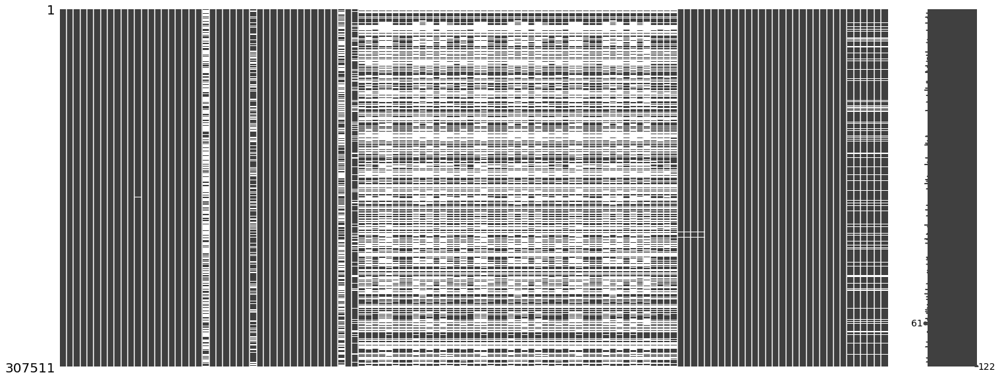

In [10]:
msno.matrix(df)

In [11]:
# 欠損値が何パーセント含まれるかを確認する。
df_mssing = pd.DataFrame(df.isnull().sum(), columns=['Total'])
#print(len(data))
df_mssing['missing_ratio'] = (df_mssing['Total']/len(data))*100
df_mssing.sort_values('missing_ratio', ascending=False)

,Total,missing_ratio
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


欠損値の多い特徴量が存在する。 
グラフの中央付近の項目は、地域情報、住宅情報等の欠損が多いようである。  

特徴量の説明が以下のものを削除してみる。46列から92列が該当する。  
'Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor'   

In [12]:
# 上記の列を削除する
# この書き方だと複数回実行したら、意図しない列まで削除してしまう！
df = df.drop(data.columns[46:92], axis=1)

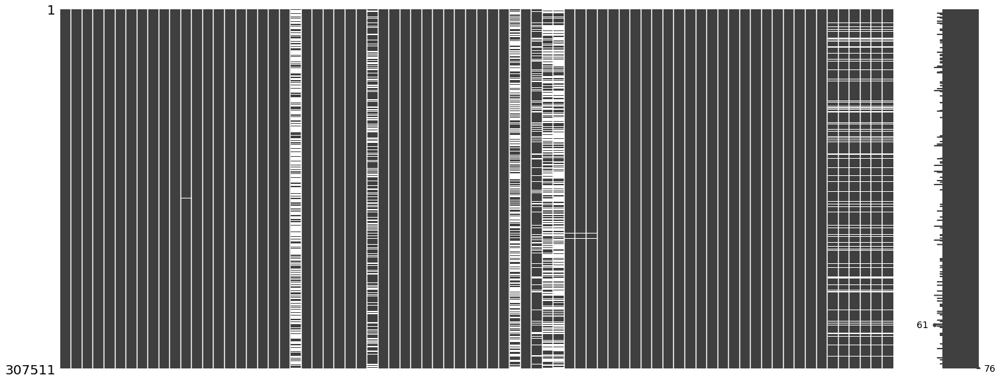

In [13]:
# 可視化する
msno.matrix(df)

In [14]:
# 欠損値が何パーセント含まれるかを確認する。
df_mssing = pd.DataFrame(df.isnull().sum(), columns=['Total'])
#print(len(data))
df_mssing['missing_ratio'] = (df_mssing['Total']/len(data))*100
df_mssing.sort_values('missing_ratio', ascending=False)

,Total,missing_ratio
OWN_CAR_AGE,202929,65.990810
BASEMENTAREA_AVG,179943,58.515956
EXT_SOURCE_1,173378,56.381073
APARTMENTS_AVG,156061,50.749729
OCCUPATION_TYPE,96391,31.345545
EXT_SOURCE_3,60965,19.825307
AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.501631
AMT_REQ_CREDIT_BUREAU_QRT,41519,13.501631
AMT_REQ_CREDIT_BUREAU_MON,41519,13.501631
AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.501631


'APARTMENTS_AVG'、'BASEMENTAREA_AVG'は情報の収集が難しい特徴である可能性があるので削除する。  
'OWN_CAR_AGE'は車を持っている人しか値を持つことができないので、車の所有に依存していると思われる。「欠損値が観測データに依存して発生している（MAR）」パターンであると思われる。  
'CREDIT_BUREAU'付く特徴量は、信用調査所の問い合わせの有無のようである。 
'OCCUPATION_TYPE'の欠損が３割近くと多いが、'AMT_INCOME_TOTAL'が0なのかも気になる。

In [15]:
#APARTMENTS_AVG'、'BASEMENTAREA_AVG'は情報の収集が難しい特徴である可能性があるので削除する。
df = df.drop(['APARTMENTS_AVG','BASEMENTAREA_AVG'], axis=1)

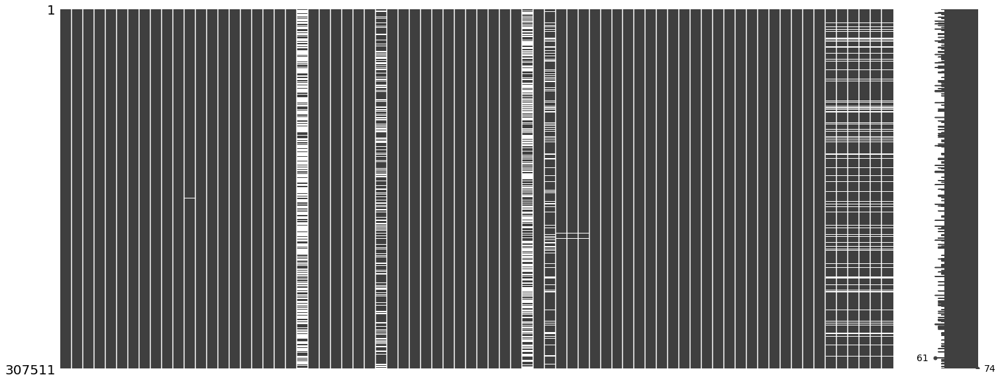

In [16]:
# 可視化する
msno.matrix(df)

In [17]:
# 'OWN_CAR_AGE'は車を持っている人しか値を持つことができないので、車の所持数に依存している。「欠損値が観測データに依存して発生している（MAR）」パターンであると思われる。
df_car_no = data[data["FLAG_OWN_CAR"]=='N'].isnull().sum()
df_car_yes = data[data["FLAG_OWN_CAR"]=='Y'].isnull().sum()

print(df.FLAG_OWN_CAR.value_counts())

print("自動車を所有していない人の所有年数欠損:{}".format(df_car_no['OWN_CAR_AGE'] ))
print("自動車を所有している人の所有年数欠損:{}".format(df_car_yes['OWN_CAR_AGE'] ))

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64
自動車を所有していない人の所有年数欠損:202924
自動車を所有している人の所有年数欠損:5


OWN_CAR_AGE'は、車の所有に依存しているようである。  
５つのデータを除いて、車の所有者は所有年数の値を持っている。  

In [18]:
# 'CREDIT_BUREAU'付く特徴量について
columns_credit_bereau = ['AMT_REQ_CREDIT_BUREAU_HOUR',
                                        'AMT_REQ_CREDIT_BUREAU_DAY',
                                        'AMT_REQ_CREDIT_BUREAU_WEEK',
                                        'AMT_REQ_CREDIT_BUREAU_MON',
                                        'AMT_REQ_CREDIT_BUREAU_QRT',
                                        'AMT_REQ_CREDIT_BUREAU_YEAR']

In [19]:
df[columns_credit_bereau].describe()

,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [20]:
#target==0の人たち
df_target_0 = df[df['TARGET']==0]
#df_target_0 
df_target_0[columns_credit_bereau].describe()

,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,245459.000000,245459.000000,245459.000000,245459.000000,245459.000000,245459.000000
mean,0.006380,0.006914,0.034315,0.270697,0.265939,1.889199
std,0.083759,0.111091,0.204747,0.928799,0.805355,1.863376
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [21]:
#target==1の人たち
df_target_1 = df[df['TARGET']==1]
#df_target_1 
df_target_1[columns_credit_bereau].describe()

,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,20533.000000,20533.000000,20533.000000,20533.000000,20533.000000,20533.000000
mean,0.006672,0.008036,0.034919,0.227926,0.259923,2.028783
std,0.084926,0.106682,0.203941,0.745116,0.643789,1.934063
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,2.000000,4.000000,6.000000,17.000000,19.000000,22.000000


返済能力のある人とない人とでは、信用調査所からの問い合わせ件数に違いはあるようである。ただし、有意な差であるのかは定かではない。    

In [22]:
# 'OCCUPATION_TYPE'の欠損が３割近くと多いが、'AMT_INCOME_TOTAL'が0なのかも気になる。
df_occu_t = data['OCCUPATION_TYPE'].notnull()
df_occu_f = data['OCCUPATION_TYPE'].isnull()

In [23]:
# 'OCCUPATION_TYPE'が欠損していない
df[df_occu_t].describe() 

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,211120.000000,211120.000000,211120.000000,2.111200e+05,2.111200e+05,211108.000000,2.108990e+05,211120.000000,211120.000000,211120.000000,...,211120.000000,211120.000000,211120.000000,211120.000000,182823.000000,182823.000000,182823.000000,182823.000000,182823.000000,182823.000000
mean,278221.563182,0.087851,0.502923,1.757752e+05,6.103016e+05,27793.198221,5.481799e+05,0.020705,-14763.481778,-2377.447523,...,0.009942,0.000729,0.000639,0.000379,0.006438,0.006947,0.033902,0.279855,0.260213,1.857857
std,102823.536493,0.283078,0.764362,2.751414e+05,4.057490e+05,14622.071200,3.723453e+05,0.013654,3643.724281,2333.841311,...,0.099214,0.026998,0.025279,0.019463,0.084177,0.111015,0.202892,0.937973,0.859621,1.823299
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1980.000000,4.050000e+04,0.000290,-25200.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189166.750000,0.000000,0.000000,1.125000e+05,2.779695e+05,17077.500000,2.475000e+05,0.010006,-17541.000000,-3164.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278226.500000,0.000000,0.000000,1.575000e+05,5.212800e+05,25836.750000,4.500000e+05,0.018850,-14574.500000,-1641.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367366.500000,0.000000,1.000000,2.115000e+05,8.248230e+05,35586.000000,6.885000e+05,0.028663,-11789.000000,-767.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,24.000000,261.000000,23.000000


In [24]:
# 'OCCUPATION_TYPE'が欠損している
df[df_occu_f].describe() 

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,96391.000000,96391.000000,96391.000000,9.639100e+04,9.639100e+04,96391.000000,9.633400e+04,96391.000000,96391.000000,96391.000000,...,96391.000000,96391.000000,96391.000000,96391.000000,83169.000000,83169.000000,83169.000000,83169.000000,83169.000000,83169.000000
mean,278090.620794,0.065131,0.228974,1.535160e+05,5.743297e+05,25609.163496,5.169774e+05,0.021224,-18826.302425,-2402.280317,...,0.004160,0.000301,0.000218,0.000239,0.006324,0.007118,0.035374,0.240005,0.277038,1.992557
std,102717.544244,0.246757,0.576553,1.150286e+05,3.941373e+05,14092.986522,3.620997e+05,0.014206,4510.510926,2349.053534,...,0.064365,0.017343,0.014759,0.015445,0.083125,0.110189,0.208570,0.865124,0.626098,1.963464
min,100011.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.500000e+04,0.000290,-25229.000000,-17546.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189114.500000,0.000000,0.000000,9.000000e+04,2.636865e+05,15502.500000,2.250000e+05,0.010032,-22404.000000,-3203.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278145.000000,0.000000,0.000000,1.350000e+05,4.950000e+05,23229.000000,4.500000e+05,0.018850,-20476.000000,-1663.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,366647.500000,0.000000,0.000000,1.800000e+05,7.819200e+05,32436.000000,6.750000e+05,0.028663,-15325.000000,-772.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456252.000000,1.000000,14.000000,1.800009e+07,4.050000e+06,230161.500000,4.050000e+06,0.072508,-7673.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,8.000000,8.000000,27.000000,7.000000,25.000000


In [25]:
# 返済能力の有無と欠損の割合
# 値が高いほど、返済能力がある人の方が返済能力のない人に比べ欠損の割合が高い
df_null0 = df[df["TARGET"]==0].isnull().sum()
df_null1 = df[df["TARGET"]==1].isnull().sum()
df_null = pd.concat([pd.DataFrame(df_null0/len(df[df["TARGET"]==0]), columns=["all the others"]),
                     pd.DataFrame(df_null1/len(df[df["TARGET"]==1]), columns=["client with payment difficulties"]),
                     pd.DataFrame(df.isnull().sum(), columns=["Total"])], axis=1)
df_null_ratio_ratio = df_null[df_null["Total"]>10000].iloc[:, 0] / df_null[df_null["Total"]>10000].iloc[:, 1]
df_null_ratio_ratio.sort_values(ascending=False)

OCCUPATION_TYPE               1.260524
OWN_CAR_AGE                   0.945336
EXT_SOURCE_1                  0.942969
EXT_SOURCE_3                  0.855258
AMT_REQ_CREDIT_BUREAU_YEAR    0.761699
AMT_REQ_CREDIT_BUREAU_QRT     0.761699
AMT_REQ_CREDIT_BUREAU_MON     0.761699
AMT_REQ_CREDIT_BUREAU_WEEK    0.761699
AMT_REQ_CREDIT_BUREAU_DAY     0.761699
AMT_REQ_CREDIT_BUREAU_HOUR    0.761699
dtype: float64

'OCCUPATION_TYPE'が欠損しているからといって、返済能力がないわけではないようである。

In [26]:
df["OCCUPATION_TYPE"].unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', nan,
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

In [27]:
df.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [28]:
# 性別について
df.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

女性の件数は、男性の件数の2倍程である。  
女性の方が小さい額の買い物でキャッシュカードを使うことが多いのではないかと思われる。
XNAは４件である。無視できる件数として、削除する。  

#### クラスごとのデータ数をグラフに出す

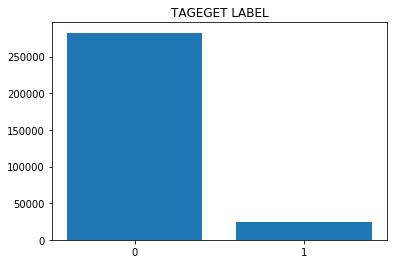

In [29]:
series_target_value_counts = data["TARGET"].value_counts()
plt.title("TAGEGET LABEL")
plt.bar(series_target_value_counts.index, series_target_value_counts.values)
plt.xticks(np.arange(0, 2, 1))
plt.show()

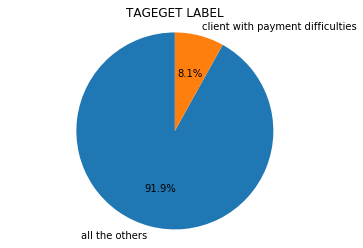

client with payment difficulties : 24825
all the others : 282686


In [30]:
plt.title("TAGEGET LABEL")
plt.pie((data["TARGET"].value_counts()), labels=["all the others", "client with payment difficulties"], startangle=90, autopct="%1.1f%%")
plt.axis('equal')
plt.show()
print("client with payment difficulties :", data["TARGET"].value_counts()[1])
print("all the others :", data["TARGET"].value_counts()[0])

返済能力がない人の方が少ない。返済能力のない人の特徴を確認し、その特徴に当てはまる人は返済能力がないと推測した方が良いように思える。  

## 【問題3】課題設定

課題1:  
'OCCUPATION_TYPE'が欠損しているからといって、返済能力がないわけではないことの検証をする。  
  
課題2:  
返済能力のない人の特徴を検証する。  
  
課題3:  
職業ごとに返済能力に差があるか検証する。  

課題4:    
性別ごとに返済能力に差があるか検証する。→未検証  
  
課題5:   
契約タイプごとに返済能力（結果）に差があるか検証する。→未検証  
  
課題6:  
女性の方が小さい額の買い物でクレジットカードを使うことが多いか検証する。→未検証  

## 【問題4】データ探索

In [31]:
# 前処理
df['CODE_GENDER'].unique()

array(['M', 'F', 'XNA'], dtype=object)

In [32]:
df_dummies = pd.get_dummies(df)
# print(df_dummies.columns[0:100])

In [33]:
df_dummies.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,-2385.231497,...,0.000208,0.000159,0.002052,0.025466,0.000654,0.007167,0.003860,0.017554,0.004315,0.180072
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,2338.644865,...,0.014425,0.012622,0.045252,0.157535,0.025558,0.084356,0.062009,0.131323,0.065549,0.384248
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-3176.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1648.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-769.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [34]:
#課題4 性別ごとに返済能力に差があるか確認する。  

df.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [35]:
#indexを性別ごとにまとめる
index_gender_m = df_dummies[df_dummies['CODE_GENDER_M']==1].index
index_gender_f = df_dummies[df_dummies['CODE_GENDER_F']==1].index
index_gender_xna = df_dummies[df_dummies['CODE_GENDER_XNA']==1].index

In [36]:
df_gender_m = df_dummies.loc[index_gender_m.values]
df_gender_f = df_dummies.loc[index_gender_f.values]
df_gender_xna = df_dummies.loc[index_gender_xna.values]

#### CODE_GENDER==M

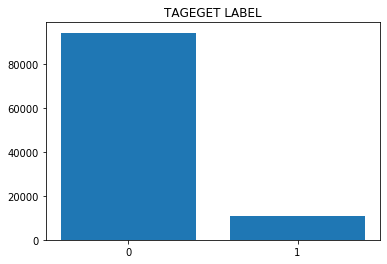

In [37]:
series_target_value_counts = df_gender_m["TARGET"].value_counts()
plt.title("TAGEGET LABEL")
plt.bar(series_target_value_counts.index, series_target_value_counts.values)
plt.xticks(np.arange(0, 2, 1))
plt.show()

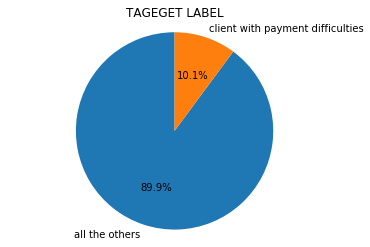

client with payment difficulties : 10655
all the others : 94404


In [38]:
data_target_value_counts = df_gender_m["TARGET"].value_counts()
plt.title("TAGEGET LABEL")
plt.pie((data_target_value_counts), labels=["all the others", "client with payment difficulties"], startangle=90, autopct="%1.1f%%")
plt.axis('equal')
plt.show()
print("client with payment difficulties :", data_target_value_counts[1])
print("all the others :", data_target_value_counts[0])

尖度(Kurtosis) : 3954.7947665484157
歪度(Skewness) : 36.45053401631923


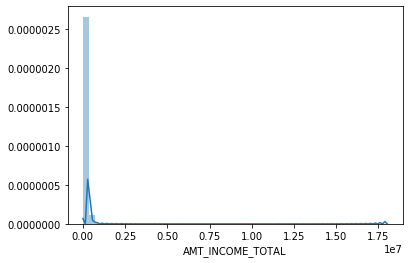

In [39]:
series_plot = df_gender_m['AMT_INCOME_TOTAL']
sns.distplot(series_plot)
print("尖度(Kurtosis) :", series_plot.kurt())
print("歪度(Skewness) :", series_plot.skew())

In [40]:
series_log = df_gender_m['AMT_INCOME_TOTAL']
series_log = series_log.apply(np.log)
df_gender_m['AMT_INCOME_TOTAL'] = series_log

尖度(Kurtosis) : 1.1322897409792225
歪度(Skewness) : 0.22790518622980355


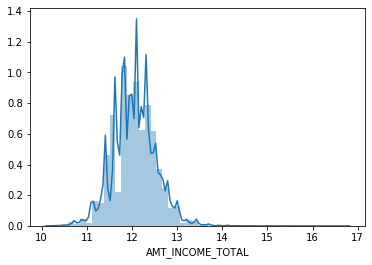

In [41]:
series_plot = df_gender_m['AMT_INCOME_TOTAL']
sns.distplot(series_plot)
print("尖度(Kurtosis) :", series_plot.kurt())
print("歪度(Skewness) :", series_plot.skew())

#### CODE_GENDER==F

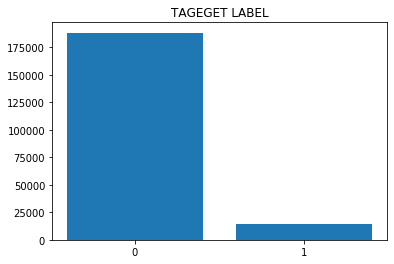

In [42]:
series_target_value_counts = df_gender_f["TARGET"].value_counts()
plt.title("TAGEGET LABEL")
plt.bar(series_target_value_counts.index, series_target_value_counts.values)
plt.xticks(np.arange(0, 2, 1))
plt.show()

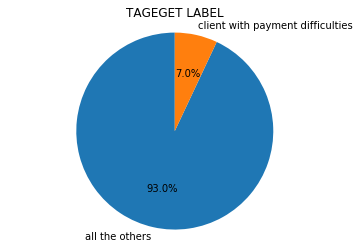

client with payment difficulties : 14170
all the others : 188278


In [43]:
data_target_value_counts = df_gender_f["TARGET"].value_counts()
plt.title("TAGEGET LABEL")
plt.pie((data_target_value_counts), labels=["all the others", "client with payment difficulties"], startangle=90, autopct="%1.1f%%")
plt.axis('equal')
plt.show()
print("client with payment difficulties :", data_target_value_counts[1])
print("all the others :", data_target_value_counts[0])

尖度(Kurtosis) : 161400.95531894508
歪度(Skewness) : 379.9137441384148


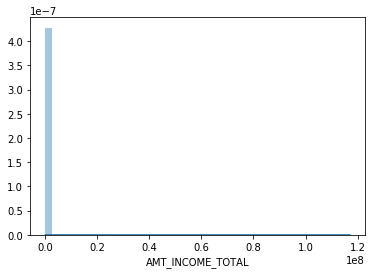

In [44]:
series_plot = df_gender_f['AMT_INCOME_TOTAL']
sns.distplot(series_plot)
print("尖度(Kurtosis) :", series_plot.kurt())
print("歪度(Skewness) :", series_plot.skew())

In [45]:
series_log = df_gender_f['AMT_INCOME_TOTAL']
series_log = series_log.apply(np.log)
df_gender_f['AMT_INCOME_TOTAL'] = series_log

尖度(Kurtosis) : 0.6629687009504059
歪度(Skewness) : 0.1715992456805269


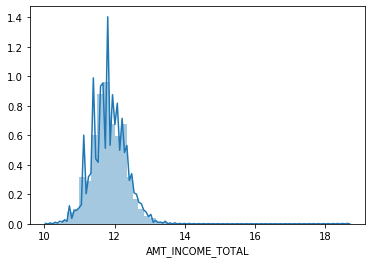

In [46]:
series_plot = df_gender_f['AMT_INCOME_TOTAL']
sns.distplot(series_plot)
print("尖度(Kurtosis) :", series_plot.kurt())
print("歪度(Skewness) :", series_plot.skew())

In [47]:
#AMT_CREDIT

#### 性別で比較

#### 職業ごとの特徴

In [48]:
display(df.OCCUPATION_TYPE.unique())

array(['Laborers', 'Core staff', 'Accountants', 'Managers', nan,
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

In [49]:
display(df.OCCUPATION_TYPE.value_counts().index)

Index(['Laborers', 'Sales staff', 'Core staff', 'Managers', 'Drivers',
       'High skill tech staff', 'Accountants', 'Medicine staff',
       'Security staff', 'Cooking staff', 'Cleaning staff',
       'Private service staff', 'Low-skill Laborers', 'Waiters/barmen staff',
       'Secretaries', 'Realty agents', 'HR staff', 'IT staff'],
      dtype='object')

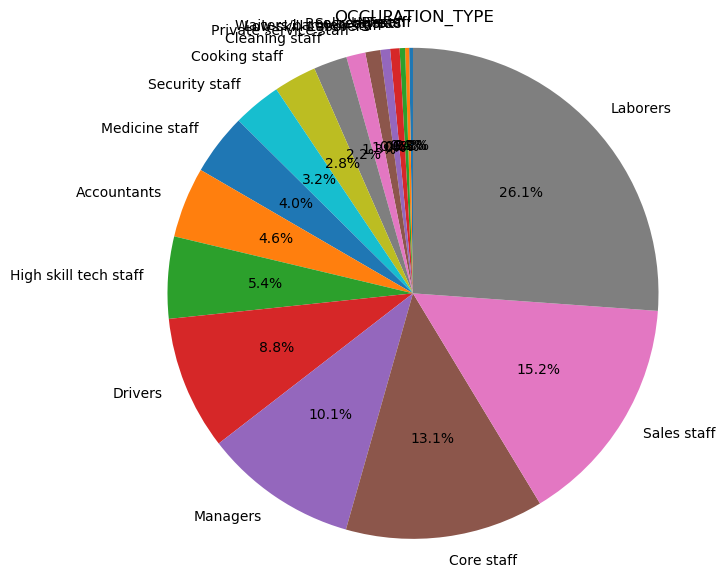

,value,ratio
Laborers,55186,26.139636
Sales staff,32102,15.205570
Core staff,27570,13.058924
Managers,21371,10.122679
Drivers,18603,8.811576
High skill tech staff,11380,5.390299
Accountants,9813,4.648067
Medicine staff,8537,4.043672
Security staff,6721,3.183498
Cooking staff,5946,2.816408


In [50]:
plt.figure(figsize=(7, 7), dpi=100)

series_target_value_counts = df.OCCUPATION_TYPE.value_counts().sort_values()

plt.title("OCCUPATION_TYPE")
# 小さい値はまとめるべき
plt.pie(series_target_value_counts, labels = series_target_value_counts.index, startangle=90, autopct="%1.1f%%")
plt.axis('equal')
plt.show()
df_occu_type = pd.DataFrame([])
df_occu_type['value'] = df.OCCUPATION_TYPE.value_counts()
# print(df_occu_type.value.sum())
df_occu_type['ratio'] = df.OCCUPATION_TYPE.value_counts() / df_occu_type.value.sum() * 100
display(df_occu_type)

Laborers、Sales staff、Core staffの3つの職種で50%以上に上る。

OCCUPATION_TYPE : Laborers


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,55186.000000,55186.000000,55186.000000,5.518600e+04,5.518600e+04,55184.000000,5.513400e+04,55186.000000,55186.000000,55186.000000,...,55186.000000,55186.000000,55186.000000,55186.000000,47398.000000,47398.000000,47398.000000,47398.000000,47398.000000,47398.000000
mean,277951.000979,0.105788,0.511742,1.663575e+05,5.706180e+05,26441.027001,5.077687e+05,0.020157,-14707.086453,-2424.143152,...,0.010419,0.000779,0.000598,0.000616,0.006161,0.007026,0.034073,0.276277,0.252648,1.910481
std,102598.388458,0.307568,0.769314,5.041647e+05,3.746218e+05,13082.016664,3.396327e+05,0.012509,3570.971993,2383.403028,...,0.101543,0.027903,0.024446,0.024814,0.082193,0.103187,0.199477,0.913098,0.601626,1.826072
min,100002.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,1980.000000,4.500000e+04,0.000290,-25175.000000,-17583.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189372.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16695.000000,2.340000e+05,0.010006,-17428.000000,-3223.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277782.000000,0.000000,0.000000,1.575000e+05,4.950000e+05,24930.000000,4.500000e+05,0.018850,-14504.000000,-1665.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,366883.250000,0.000000,1.000000,2.025000e+05,7.819200e+05,33403.500000,6.750000e+05,0.026392,-11814.000000,-780.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,7.000000,1.170000e+08,3.020760e+06,173704.500000,2.961000e+06,0.072508,-7680.000000,-2.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,6.000000,6.000000,18.000000,19.000000,19.000000


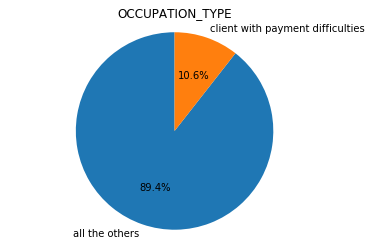

client with payment difficulties : 5838
all the others : 49348
----------
OCCUPATION_TYPE : Core staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,27570.000000,27570.000000,27570.000000,2.757000e+04,2.757000e+04,27569.000000,2.753100e+04,27570.000000,27570.000000,27570.000000,...,27570.000000,27570.000000,27570.000000,27570.000000,24393.000000,24393.000000,24393.000000,24393.000000,24393.000000,24393.000000
mean,277981.296264,0.063040,0.558070,1.726567e+05,6.252231e+05,27557.864032,5.651014e+05,0.020895,-14109.967247,-2797.755967,...,0.016104,0.000762,0.000653,0.000218,0.006518,0.007133,0.033370,0.286886,0.251507,1.682204
std,102559.187729,0.243038,0.806938,9.814711e+04,4.248567e+05,14674.705737,3.914232e+05,0.014464,3673.176875,2694.068367,...,0.125880,0.027589,0.025544,0.014751,0.080982,0.111778,0.205775,0.968645,0.604184,1.756056
min,100003.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2979.000000,4.500000e+04,0.000533,-25165.000000,-17139.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188928.750000,0.000000,0.000000,1.125000e+05,2.700000e+05,16573.500000,2.475000e+05,0.009630,-16740.750000,-3836.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277982.500000,0.000000,0.000000,1.575000e+05,5.264910e+05,25506.000000,4.545000e+05,0.018850,-13712.000000,-1894.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,366360.750000,0.000000,1.000000,2.025000e+05,8.550000e+05,35559.000000,7.200000e+05,0.028663,-11092.250000,-840.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456247.000000,1.000000,19.000000,3.600000e+06,3.375000e+06,184477.500000,3.375000e+06,0.072508,-7678.000000,-11.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,6.000000,8.000000,23.000000,7.000000,14.000000


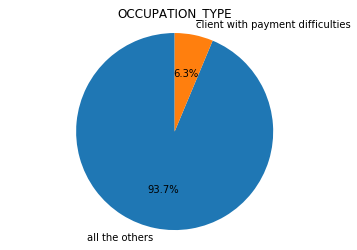

client with payment difficulties : 1738
all the others : 25832
----------
OCCUPATION_TYPE : Accountants


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,9813.000000,9813.000000,9813.000000,9.813000e+03,9.813000e+03,9812.000000,9.802000e+03,9813.000000,9813.000000,9813.000000,...,9813.000000,9813.000000,9813.000000,9813.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000,8766.000000
mean,277197.344645,0.048303,0.488536,1.945784e+05,7.097574e+05,30983.107216,6.486360e+05,0.022154,-14795.827779,-2394.102823,...,0.008968,0.001427,0.001630,0.000102,0.007187,0.006731,0.032512,0.336185,0.287588,1.710815
std,102741.815988,0.214417,0.730080,1.088768e+05,4.572474e+05,16286.128689,4.242801e+05,0.015310,3657.878771,2238.223984,...,0.094277,0.037746,0.040348,0.010095,0.094665,0.113344,0.211407,1.094729,2.847563,1.743243
min,100009.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2920.500000,4.500000e+04,0.000533,-24955.000000,-16452.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189117.000000,0.000000,0.000000,1.305000e+05,3.375000e+05,19290.375000,3.150000e+05,0.010032,-17678.000000,-3216.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,276173.000000,0.000000,0.000000,1.786500e+05,6.041520e+05,28570.500000,5.400000e+05,0.019101,-14385.000000,-1762.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,366939.000000,0.000000,1.000000,2.250000e+05,9.900000e+05,39803.625000,9.000000e+05,0.030755,-11809.000000,-826.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456207.000000,1.000000,4.000000,2.214117e+06,4.050000e+06,225000.000000,4.050000e+06,0.072508,-7698.000000,-9.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,4.000000,7.000000,17.000000,261.000000,17.000000


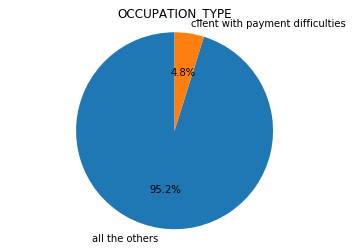

client with payment difficulties : 474
all the others : 9339
----------
OCCUPATION_TYPE : Managers


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,21371.000000,21371.000000,21371.000000,2.137100e+04,2.137100e+04,21370.000000,2.134800e+04,21371.000000,21371.000000,21371.000000,...,21371.000000,21371.000000,21371.000000,21371.000000,19188.000000,19188.000000,19188.000000,19188.000000,19188.000000,19188.000000
mean,278557.399139,0.062140,0.509522,2.603367e+05,7.750912e+05,34861.673093,7.100247e+05,0.022397,-15375.125918,-2759.318937,...,0.009218,0.000936,0.000608,0.000234,0.007244,0.007348,0.033719,0.329425,0.250521,1.751251
std,102775.942634,0.241416,0.769895,1.849410e+05,4.802257e+05,18751.451369,4.487559e+05,0.015609,3382.252903,2409.972864,...,0.095570,0.030578,0.024657,0.015294,0.091316,0.129539,0.196278,1.043553,0.591665,1.772865
min,100010.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2425.500000,4.500000e+04,0.000533,-25077.000000,-17531.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189745.000000,0.000000,0.000000,1.575000e+05,4.360320e+05,22347.000000,3.915000e+05,0.010032,-17891.000000,-3756.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,279044.000000,0.000000,0.000000,2.250000e+05,6.750000e+05,32017.500000,6.750000e+05,0.019101,-15262.000000,-2074.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,368182.500000,0.000000,1.000000,3.150000e+05,1.046142e+06,44661.375000,9.000000e+05,0.030755,-12745.500000,-1008.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456253.000000,1.000000,14.000000,9.000000e+06,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7704.000000,-13.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,9.000000,6.000000,17.000000,8.000000,21.000000


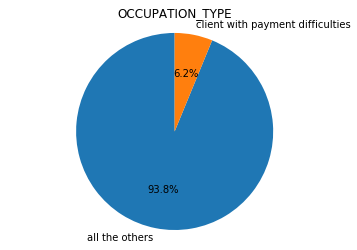

client with payment difficulties : 1328
all the others : 20043
----------
OCCUPATION_TYPE : Drivers


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,18603.000000,18603.000000,18603.000000,1.860300e+04,1.860300e+04,18602.000000,1.859000e+04,18603.000000,18603.000000,18603.000000,...,18603.000000,18603.000000,18603.000000,18603.000000,15975.000000,15975.000000,15975.000000,15975.000000,15975.000000,15975.000000
mean,278369.686610,0.113261,0.511853,1.870116e+05,6.123340e+05,29071.181970,5.478113e+05,0.020876,-15103.108531,-1939.034618,...,0.008493,0.000699,0.000645,0.000591,0.006948,0.008138,0.030610,0.274429,0.259155,1.900720
std,102919.678155,0.316920,0.771570,8.259338e+04,3.859217e+05,13704.956551,3.522446e+05,0.013810,3530.974095,1855.913162,...,0.091769,0.026427,0.025390,0.024310,0.091668,0.138166,0.203579,0.933527,0.597200,1.828446
min,100017.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2929.500000,4.500000e+04,0.000533,-24977.000000,-15147.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188443.500000,0.000000,0.000000,1.350000e+05,2.913840e+05,19215.000000,2.655000e+05,0.010006,-17835.000000,-2618.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278256.000000,0.000000,0.000000,1.800000e+05,5.264910e+05,27193.500000,4.500000e+05,0.018850,-15061.000000,-1380.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367496.500000,0.000000,1.000000,2.250000e+05,8.192160e+05,36648.000000,6.885000e+05,0.028663,-12287.500000,-682.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456238.000000,1.000000,14.000000,2.475000e+06,2.695500e+06,173574.000000,2.254500e+06,0.072508,-7704.000000,-4.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,9.000000,8.000000,24.000000,6.000000,23.000000


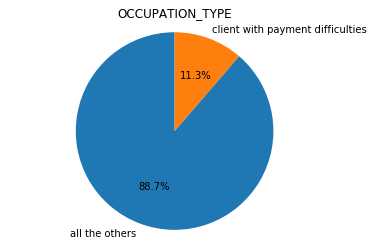

client with payment difficulties : 2107
all the others : 16496
----------
OCCUPATION_TYPE : Sales staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,32102.000000,32102.000000,32102.000000,3.210200e+04,3.210200e+04,32101.000000,3.206400e+04,32102.000000,32102.000000,32102.000000,...,32102.000000,32102.000000,32102.000000,32102.000000,26905.000000,26905.000000,26905.000000,26905.000000,26905.000000,26905.000000
mean,279136.773908,0.096318,0.502181,1.523029e+05,5.632585e+05,26130.588533,5.045241e+05,0.019948,-14030.848203,-1703.789421,...,0.006292,0.000436,0.000623,0.000280,0.005798,0.006802,0.036759,0.239101,0.276937,1.955882
std,103164.652417,0.295031,0.745554,7.761623e+04,3.708785e+05,13595.563765,3.378107e+05,0.012710,3504.447502,1476.559301,...,0.079076,0.020879,0.024953,0.016742,0.079279,0.106605,0.208595,0.827280,0.627557,1.873892
min,100025.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2317.500000,4.500000e+04,0.000533,-25121.000000,-15338.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189377.000000,0.000000,0.000000,1.035000e+05,2.700000e+05,16132.500000,2.295000e+05,0.009657,-16659.000000,-2388.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,279587.500000,0.000000,0.000000,1.350000e+05,4.904955e+05,24412.500000,4.500000e+05,0.018801,-13851.000000,-1291.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,369155.000000,0.000000,1.000000,1.800000e+05,7.702920e+05,33016.500000,6.750000e+05,0.026392,-11099.250000,-615.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456251.000000,1.000000,9.000000,2.025000e+06,3.150000e+06,188136.000000,3.150000e+06,0.072508,-7676.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,6.000000,6.000000,18.000000,8.000000,17.000000


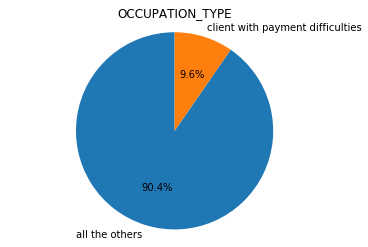

client with payment difficulties : 3092
all the others : 29010
----------
OCCUPATION_TYPE : Cleaning staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,4653.000000,4653.000000,4653.000000,4.653000e+03,4.653000e+03,4653.000000,4.648000e+03,4653.000000,4653.000000,4653.000000,...,4653.000000,4653.000000,4653.0,4653.0,3962.000000,3962.000000,3962.000000,3962.000000,3962.000000,3962.000000
mean,279890.247797,0.096067,0.363421,1.307909e+05,5.109609e+05,22901.733075,4.494996e+05,0.019903,-17277.854073,-2130.732431,...,0.005373,0.000215,0.0,0.0,0.006815,0.004291,0.031802,0.245331,0.275618,2.200404
std,103072.836761,0.294715,0.733731,6.407579e+04,3.294648e+05,11322.997012,2.944321e+05,0.012687,3558.970016,2105.587682,...,0.073111,0.014660,0.0,0.0,0.091021,0.069126,0.187997,0.837992,0.640512,1.965679
min,100030.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,2205.000000,4.500000e+04,0.001276,-25089.000000,-16236.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190333.000000,0.000000,0.000000,9.000000e+04,2.547000e+05,14562.000000,2.250000e+05,0.010006,-19855.000000,-2883.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,279841.000000,0.000000,0.000000,1.125000e+05,4.500000e+05,21577.500000,4.050000e+05,0.018801,-17707.000000,-1477.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,369744.000000,0.000000,0.000000,1.575000e+05,6.796710e+05,29196.000000,6.750000e+05,0.025164,-14684.000000,-685.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456195.000000,1.000000,7.000000,1.080000e+06,2.220260e+06,106452.000000,1.984500e+06,0.072508,-7712.000000,-16.000000,...,1.000000,1.000000,0.0,0.0,2.000000,2.000000,3.000000,13.000000,7.000000,9.000000


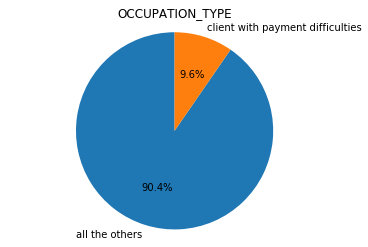

client with payment difficulties : 447
all the others : 4206
----------
OCCUPATION_TYPE : Cooking staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,5946.000000,5946.000000,5946.000000,5946.000000,5.946000e+03,5945.000000,5.940000e+03,5946.000000,5946.000000,5946.000000,...,5946.000000,5946.000000,5946.000000,5946.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000
mean,277249.663808,0.104440,0.483855,138396.508176,5.391743e+05,25082.813793,4.765018e+05,0.019635,-15145.885133,-2152.466868,...,0.007736,0.000505,0.000505,0.000168,0.005100,0.005492,0.031385,0.221656,0.253629,1.979600
std,102856.054566,0.305856,0.752115,62742.083077,3.462262e+05,12476.932771,3.102328e+05,0.012475,3503.983255,2152.899019,...,0.087623,0.022458,0.022458,0.012968,0.071239,0.094841,0.200538,0.720442,0.600349,1.847421
min,100031.000000,0.000000,0.000000,27000.000000,4.500000e+04,3150.000000,4.500000e+04,0.000938,-24985.000000,-14981.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188120.000000,0.000000,0.000000,90000.000000,2.695500e+05,15943.500000,2.250000e+05,0.009630,-17890.000000,-2818.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,276265.000000,0.000000,0.000000,126000.000000,4.725000e+05,23539.500000,4.500000e+05,0.018801,-15211.000000,-1443.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,365395.250000,0.000000,1.000000,171000.000000,7.405796e+05,31653.000000,6.750000e+05,0.026392,-12352.250000,-705.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456240.000000,1.000000,5.000000,540000.000000,2.695500e+06,177826.500000,2.254500e+06,0.072508,-7690.000000,-9.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,6.000000,15.000000,5.000000,15.000000


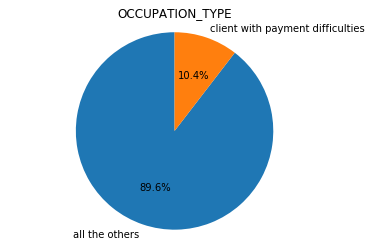

client with payment difficulties : 621
all the others : 5325
----------
OCCUPATION_TYPE : Private service staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,2652.000000,2652.000000,2652.000000,2.652000e+03,2.652000e+03,2652.000000,2.648000e+03,2652.000000,2652.000000,2652.000000,...,2652.000000,2652.000000,2652.000000,2652.0,2228.000000,2228.000000,2228.000000,2228.000000,2228.000000,2228.000000
mean,277683.879336,0.065988,0.514329,1.823348e+05,6.306645e+05,29261.735294,5.663879e+05,0.022308,-14240.952112,-2238.281297,...,0.000754,0.001508,0.001508,0.0,0.005835,0.008079,0.043986,0.309695,0.309695,1.926391
std,103162.937375,0.248308,0.717948,1.047512e+05,4.087140e+05,15112.993950,3.701638e+05,0.015601,3308.168970,1977.293166,...,0.027457,0.038815,0.038815,0.0,0.076180,0.130376,0.229884,1.188991,0.658034,1.851701
min,100036.000000,0.000000,0.000000,3.600000e+04,4.500000e+04,3474.000000,4.500000e+04,0.001276,-24849.000000,-16266.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188674.000000,0.000000,0.000000,1.215000e+05,2.970979e+05,18194.625000,2.700000e+05,0.010006,-16578.250000,-3025.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,276769.000000,0.000000,0.000000,1.575000e+05,5.391000e+05,26856.000000,4.545000e+05,0.019101,-14146.500000,-1704.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,366977.500000,0.000000,1.000000,2.250000e+05,8.575515e+05,37796.625000,7.515000e+05,0.030755,-11627.500000,-885.750000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,455719.000000,1.000000,5.000000,3.150000e+06,2.695500e+06,130554.000000,2.250000e+06,0.072508,-7489.000000,-1.000000,...,1.000000,1.000000,1.000000,0.0,1.000000,5.000000,5.000000,19.000000,6.000000,9.000000


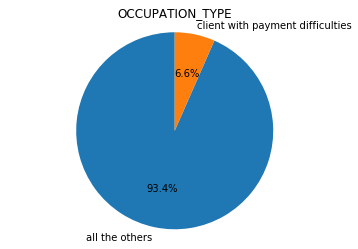

client with payment difficulties : 175
all the others : 2477
----------
OCCUPATION_TYPE : Medicine staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,8537.000000,8537.000000,8537.000000,8.537000e+03,8.537000e+03,8536.000000,8.528000e+03,8537.000000,8537.000000,8537.00000,...,8537.000000,8537.000000,8537.000000,8537.0,7710.000000,7710.000000,7710.000000,7710.000000,7710.000000,7710.000000
mean,276504.129085,0.067002,0.500996,1.497096e+05,6.074307e+05,25872.590265,5.406704e+05,0.019772,-15560.841513,-3750.26555,...,0.013354,0.000351,0.000234,0.0,0.007263,0.007912,0.033593,0.263813,0.243580,1.814527
std,102793.028752,0.250041,0.774494,7.407880e+04,3.971767e+05,13171.914102,3.602077e+05,0.012770,3645.397302,3175.68263,...,0.114791,0.018744,0.015305,0.0,0.089386,0.135010,0.205735,0.865250,0.589676,1.806029
min,100054.000000,0.000000,0.000000,2.655000e+04,4.500000e+04,3195.000000,4.500000e+04,0.000938,-25200.000000,-16651.00000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188618.000000,0.000000,0.000000,9.900000e+04,2.762775e+05,16285.500000,2.385000e+05,0.009630,-18276.000000,-5496.00000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,274906.000000,0.000000,0.000000,1.350000e+05,5.293485e+05,24043.500000,4.545000e+05,0.018801,-15516.000000,-2762.00000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,364862.000000,0.000000,1.000000,1.800000e+05,8.100000e+05,32976.000000,6.795000e+05,0.026392,-12958.000000,-1243.00000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456243.000000,1.000000,5.000000,1.350000e+06,2.695500e+06,216589.500000,2.250000e+06,0.072508,-7683.000000,-24.00000,...,1.000000,1.000000,1.000000,0.0,2.000000,5.000000,5.000000,16.000000,5.000000,11.000000


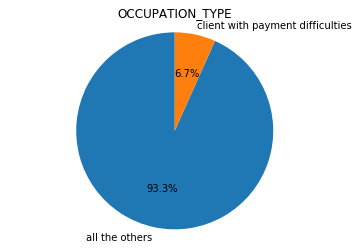

client with payment difficulties : 572
all the others : 7965
----------
OCCUPATION_TYPE : Security staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,6721.000000,6721.000000,6721.000000,6721.000000,6.721000e+03,6720.000000,6.713000e+03,6721.000000,6721.000000,6721.000000,...,6721.000000,6721.000000,6721.000000,6721.000000,5709.000000,5709.000000,5709.000000,5709.000000,5709.00000,5709.000000
mean,276908.539205,0.107424,0.376283,149662.695953,5.570803e+05,25065.525000,4.932763e+05,0.019620,-16532.951049,-1904.809106,...,0.006844,0.000744,0.000446,0.000595,0.005430,0.006131,0.037660,0.276406,0.26502,2.037835
std,102760.176407,0.309675,0.706199,69621.523467,3.659570e+05,12521.057266,3.304871e+05,0.012282,3814.661277,1856.551614,...,0.082452,0.027267,0.021124,0.024390,0.075841,0.090534,0.214613,0.984091,0.61259,1.939512
min,100068.000000,0.000000,0.000000,27000.000000,4.500000e+04,2317.500000,4.500000e+04,0.001276,-25170.000000,-16352.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,187834.000000,0.000000,0.000000,103500.000000,2.699820e+05,16047.000000,2.250000e+05,0.009657,-19581.000000,-2585.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000
50%,277762.000000,0.000000,0.000000,135000.000000,4.814955e+05,23800.500000,4.500000e+05,0.018801,-16768.000000,-1345.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.000000
75%,363936.000000,0.000000,1.000000,180000.000000,7.819200e+05,31464.000000,6.750000e+05,0.026392,-13670.000000,-646.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,3.000000
max,456237.000000,1.000000,7.000000,832500.000000,2.700000e+06,180000.000000,2.700000e+06,0.072508,-7718.000000,-3.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,4.000000,19.000000,4.00000,22.000000


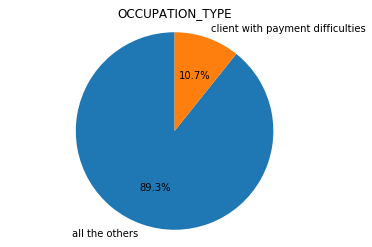

client with payment difficulties : 722
all the others : 5999
----------
OCCUPATION_TYPE : High skill tech staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,11380.000000,11380.000000,11380.000000,1.138000e+04,1.138000e+04,11379.000000,1.137100e+04,11380.000000,11380.000000,11380.000000,...,11380.000000,11380.000000,11380.000000,11380.000000,10028.000000,10028.000000,10028.000000,10028.000000,10028.000000,10028.000000
mean,279163.345782,0.061599,0.473989,1.828420e+05,6.429118e+05,28649.270762,5.817842e+05,0.022056,-14756.073989,-2739.979086,...,0.012302,0.000967,0.000615,0.000703,0.006681,0.006582,0.032310,0.320901,0.257080,1.721480
std,102920.793848,0.240437,0.727192,9.571100e+04,4.230079e+05,15179.102920,3.886560e+05,0.014797,3776.142693,2768.250377,...,0.110236,0.031077,0.024795,0.026506,0.083882,0.089079,0.201602,1.036260,0.599628,1.758454
min,100101.000000,0.000000,0.000000,2.700000e+04,4.500000e+04,2673.000000,4.500000e+04,0.001276,-25140.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190185.750000,0.000000,0.000000,1.125000e+05,2.844000e+05,17550.000000,2.700000e+05,0.010032,-17727.500000,-3605.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,279771.500000,0.000000,0.000000,1.575000e+05,5.444910e+05,26442.000000,4.545000e+05,0.019101,-14490.000000,-1832.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,369229.000000,0.000000,1.000000,2.250000e+05,9.000000e+05,36724.500000,7.875000e+05,0.028663,-11570.000000,-813.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456239.000000,1.000000,6.000000,1.890000e+06,2.695500e+06,225000.000000,2.475000e+06,0.072508,-7680.000000,-4.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,7.000000,18.000000,8.000000,14.000000


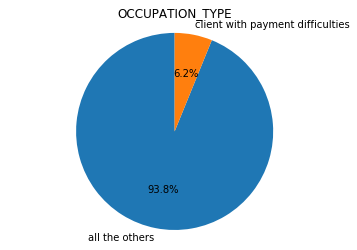

client with payment difficulties : 701
all the others : 10679
----------
OCCUPATION_TYPE : Waiters/barmen staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,1348.000000,1348.000000,1348.000000,1348.000000,1.348000e+03,1348.000000,1.346000e+03,1348.000000,1348.000000,1348.000000,...,1348.000000,1348.000000,1348.000000,1348.0,1107.000000,1107.000000,1107.000000,1107.000000,1107.000000,1107.000000
mean,279728.885757,0.112760,0.452522,144272.583828,4.914520e+05,24256.729228,4.389083e+05,0.019831,-13054.165430,-1873.172849,...,0.007418,0.000742,0.000742,0.0,0.004517,0.005420,0.040650,0.217706,0.275519,1.885276
std,102496.412109,0.316416,0.871031,67068.772193,3.380597e+05,12498.135316,3.031752e+05,0.013137,3814.218768,1760.197707,...,0.085842,0.027237,0.027237,0.0,0.067085,0.073454,0.206518,0.819370,0.612532,1.818239
min,100104.000000,0.000000,0.000000,29250.000000,4.500000e+04,2713.500000,4.500000e+04,0.001276,-24095.000000,-11637.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,193056.000000,0.000000,0.000000,90000.000000,2.328592e+05,14751.000000,2.250000e+05,0.009495,-15750.500000,-2555.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,277133.000000,0.000000,0.000000,135000.000000,4.138672e+05,22455.000000,3.600000e+05,0.018634,-12375.500000,-1317.500000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,369150.000000,0.000000,1.000000,180000.000000,6.750000e+05,31066.875000,5.928750e+05,0.028663,-9951.250000,-669.250000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456003.000000,1.000000,19.000000,585000.000000,2.377431e+06,91363.500000,1.984500e+06,0.072508,-7689.000000,-8.000000,...,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,2.000000,14.000000,4.000000,9.000000


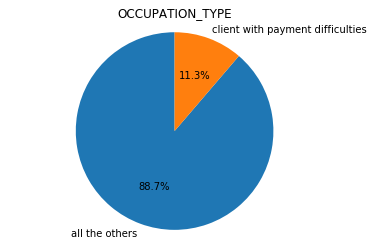

client with payment difficulties : 152
all the others : 1196
----------
OCCUPATION_TYPE : Low-skill Laborers


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,2093.000000,2093.000000,2093.000000,2093.000000,2.093000e+03,2093.000000,2.092000e+03,2093.000000,2093.000000,2093.000000,...,2093.000000,2093.0,2093.0,2093.000000,1617.000000,1617.000000,1617.000000,1617.000000,1617.000000,1617.000000
mean,277323.944099,0.171524,0.460105,133228.001911,4.584648e+05,23235.564023,3.985666e+05,0.019270,-14217.544673,-1664.186813,...,0.003822,0.0,0.0,0.000478,0.004329,0.003092,0.026592,0.196660,0.276438,2.084725
std,104336.897088,0.377056,0.771728,54003.583810,2.974630e+05,11504.472555,2.625215e+05,0.011317,3543.747335,1705.675449,...,0.061721,0.0,0.0,0.021858,0.065673,0.055538,0.160939,0.746884,0.617120,1.948500
min,100113.000000,0.000000,0.000000,27000.000000,4.797000e+04,3879.000000,4.050000e+04,0.001276,-24034.000000,-16364.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188216.000000,0.000000,0.000000,90000.000000,2.475000e+05,14472.000000,2.250000e+05,0.009657,-16812.000000,-2273.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,280621.000000,0.000000,0.000000,121500.000000,3.731400e+05,21888.000000,3.150000e+05,0.018801,-13864.000000,-1122.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,363781.000000,0.000000,1.000000,157500.000000,6.014700e+05,29866.500000,4.815000e+05,0.026392,-11369.000000,-521.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456245.000000,1.000000,5.000000,450000.000000,1.966500e+06,123592.500000,1.966500e+06,0.072508,-7684.000000,-17.000000,...,1.000000,0.0,0.0,1.000000,1.000000,1.000000,1.000000,16.000000,4.000000,12.000000


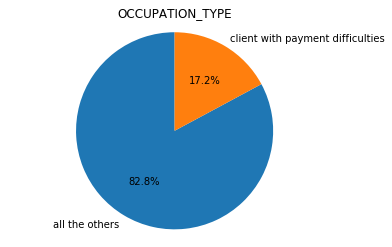

client with payment difficulties : 359
all the others : 1734
----------
OCCUPATION_TYPE : Realty agents


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,751.000000,751.000000,751.000000,751.000000,7.510000e+02,751.000000,7.510000e+02,751.000000,751.000000,751.000000,...,751.000000,751.0,751.0,751.0,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000
mean,281014.407457,0.078562,0.511318,195003.994674,6.552756e+05,30228.651132,5.872325e+05,0.021741,-13978.346205,-1785.003995,...,0.003995,0.0,0.0,0.0,0.001587,0.001587,0.034921,0.230159,0.274603,2.036508
std,105664.603798,0.269233,0.717081,82992.755612,4.113395e+05,14216.007954,3.731826e+05,0.014569,3307.578936,1547.627690,...,0.063119,0.0,0.0,0.0,0.039841,0.039841,0.192183,0.601571,0.647232,1.974463
min,100131.000000,0.000000,0.000000,67500.000000,4.797000e+04,5296.500000,4.500000e+04,0.001333,-24745.000000,-14038.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189166.500000,0.000000,0.000000,135000.000000,3.141000e+05,20232.000000,2.700000e+05,0.010089,-16196.000000,-2427.500000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,280949.000000,0.000000,0.000000,180000.000000,5.450400e+05,28507.500000,4.635000e+05,0.019101,-13715.000000,-1395.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,374616.500000,0.000000,1.000000,225000.000000,9.000000e+05,38108.250000,8.100000e+05,0.030755,-11291.500000,-726.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,454703.000000,1.000000,3.000000,675000.000000,2.695500e+06,89455.500000,2.250000e+06,0.072508,-7741.000000,-87.000000,...,1.000000,0.0,0.0,0.0,1.000000,1.000000,2.000000,5.000000,4.000000,9.000000


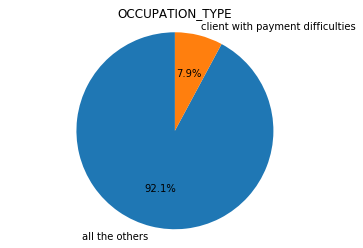

client with payment difficulties : 59
all the others : 692
----------
OCCUPATION_TYPE : Secretaries


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,1305.000000,1305.000000,1305.000000,1.305000e+03,1.305000e+03,1304.000000,1.305000e+03,1305.000000,1305.000000,1305.000000,...,1305.000000,1305.000000,1305.000000,1305.0,1144.000000,1144.000000,1144.000000,1144.000000,1144.000000,1144.000000
mean,279208.548659,0.070498,0.519540,1.605417e+05,5.935204e+05,26853.325537,5.338205e+05,0.022413,-13994.684291,-2607.050575,...,0.016092,0.000766,0.000766,0.0,0.009615,0.005245,0.030594,0.314685,0.271853,1.908217
std,103234.643629,0.256083,0.740871,1.152582e+05,3.915865e+05,14003.179058,3.590194e+05,0.015965,3746.502857,2581.189331,...,0.125877,0.027682,0.027682,0.0,0.097628,0.083496,0.182164,0.970570,0.616522,1.843710
min,100134.000000,0.000000,0.000000,4.500000e+04,4.945500e+04,3195.000000,4.500000e+04,0.001276,-24823.000000,-14108.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,192210.000000,0.000000,0.000000,1.072845e+05,2.844000e+05,16691.625000,2.475000e+05,0.010032,-16614.000000,-3493.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277509.000000,0.000000,0.000000,1.350000e+05,4.975200e+05,24576.750000,4.500000e+05,0.019101,-13449.000000,-1790.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,370861.000000,0.000000,1.000000,1.800000e+05,8.166600e+05,34383.375000,6.885000e+05,0.030755,-10948.000000,-771.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456211.000000,1.000000,4.000000,2.025000e+06,3.600000e+06,100057.500000,3.600000e+06,0.072508,-7714.000000,-16.000000,...,1.000000,1.000000,1.000000,0.0,1.000000,2.000000,2.000000,11.000000,4.000000,13.000000


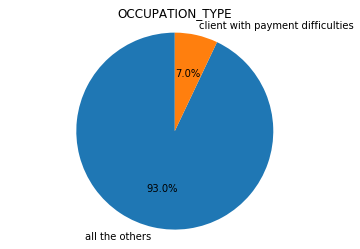

client with payment difficulties : 92
all the others : 1213
----------
OCCUPATION_TYPE : IT staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,526.000000,526.000000,526.000000,5.260000e+02,5.260000e+02,526.000000,5.250000e+02,526.000000,526.000000,526.000000,...,526.000000,526.0,526.000000,526.0,462.000000,462.000000,462.000000,462.000000,462.000000,462.000000
mean,280464.347909,0.064639,0.397338,2.134656e+05,6.475978e+05,29021.004753,5.938898e+05,0.023980,-12882.133080,-2095.570342,...,0.028517,0.0,0.003802,0.0,0.012987,0.002165,0.028139,0.290043,0.261905,1.523810
std,102472.330076,0.246121,0.670403,1.420098e+05,4.742971e+05,17607.750475,4.426744e+05,0.018031,3434.209158,2206.166764,...,0.166603,0.0,0.061604,0.0,0.113341,0.046524,0.178170,0.942068,0.569106,1.770595
min,100480.000000,0.000000,0.000000,4.500000e+04,6.682950e+04,3424.500000,5.400000e+04,0.001276,-24107.000000,-14590.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190628.750000,0.000000,0.000000,1.350000e+05,2.700000e+05,16587.000000,2.475000e+05,0.010032,-14388.000000,-2658.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,284119.500000,0.000000,0.000000,1.800000e+05,5.153130e+05,26199.000000,4.500000e+05,0.019689,-12169.000000,-1439.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,369839.250000,0.000000,1.000000,2.475000e+05,9.000000e+05,37905.750000,8.550000e+05,0.031329,-10347.750000,-642.750000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,455039.000000,1.000000,3.000000,2.025000e+06,2.695500e+06,213291.000000,2.250000e+06,0.072508,-7783.000000,-90.000000,...,1.000000,0.0,1.000000,0.0,1.000000,1.000000,2.000000,9.000000,3.000000,9.000000


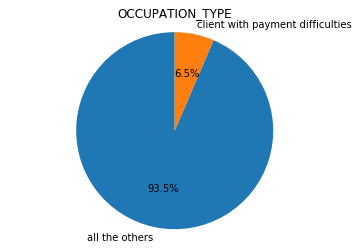

client with payment difficulties : 34
all the others : 492
----------
OCCUPATION_TYPE : HR staff


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,563.000000,563.000000,563.000000,563.000000,5.630000e+02,563.000000,5.630000e+02,563.000000,563.000000,563.000000,...,563.000000,563.0,563.0,563.0,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000
mean,277838.827709,0.063943,0.440497,188916.282416,6.849833e+05,30227.563055,6.214556e+05,0.022496,-14351.847247,-2278.866785,...,0.008881,0.0,0.0,0.0,0.013917,0.011928,0.037773,0.330020,0.284294,1.725646
std,104710.188979,0.244869,0.696658,93155.321259,4.624725e+05,16987.059509,4.222223e+05,0.016188,3734.254019,2295.278557,...,0.093903,0.0,0.0,0.0,0.117261,0.125673,0.190837,1.022863,0.618999,1.714793
min,100866.000000,0.000000,0.000000,30600.000000,4.797000e+04,5485.500000,4.500000e+04,0.001276,-24705.000000,-14273.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,185294.000000,0.000000,0.000000,135000.000000,3.150000e+05,17937.000000,2.700000e+05,0.010032,-17094.500000,-3024.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,273851.000000,0.000000,0.000000,158400.000000,5.473440e+05,26446.500000,4.770000e+05,0.019101,-13770.000000,-1533.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,364567.500000,0.000000,1.000000,225000.000000,9.211140e+05,38382.750000,9.000000e+05,0.030755,-11385.500000,-724.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,455773.000000,1.000000,3.000000,699750.000000,2.517300e+06,150759.000000,2.475000e+06,0.072508,-7724.000000,-74.000000,...,1.000000,0.0,0.0,0.0,1.000000,2.000000,1.000000,13.000000,3.000000,8.000000


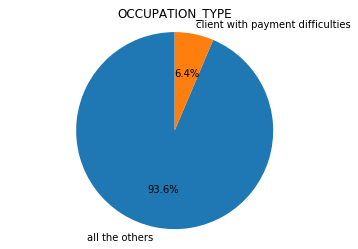

client with payment difficulties : 36
all the others : 527
----------
OCCUPATION_TYPE : nan


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,96391.000000,96391.000000,96391.000000,9.639100e+04,9.639100e+04,96391.000000,9.633400e+04,96391.000000,96391.000000,96391.000000,...,96391.000000,96391.000000,96391.000000,96391.000000,83169.000000,83169.000000,83169.000000,83169.000000,83169.000000,83169.000000
mean,278090.620794,0.065131,0.228974,1.535160e+05,5.743297e+05,25609.163496,5.169774e+05,0.021224,-18826.302425,-2402.280317,...,0.004160,0.000301,0.000218,0.000239,0.006324,0.007118,0.035374,0.240005,0.277038,1.992557
std,102717.544244,0.246757,0.576553,1.150286e+05,3.941373e+05,14092.986522,3.620997e+05,0.014206,4510.510926,2349.053534,...,0.064365,0.017343,0.014759,0.015445,0.083125,0.110189,0.208570,0.865124,0.626098,1.963464
min,100011.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.500000e+04,0.000290,-25229.000000,-17546.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189114.500000,0.000000,0.000000,9.000000e+04,2.636865e+05,15502.500000,2.250000e+05,0.010032,-22404.000000,-3203.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278145.000000,0.000000,0.000000,1.350000e+05,4.950000e+05,23229.000000,4.500000e+05,0.018850,-20476.000000,-1663.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,366647.500000,0.000000,0.000000,1.800000e+05,7.819200e+05,32436.000000,6.750000e+05,0.028663,-15325.000000,-772.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456252.000000,1.000000,14.000000,1.800009e+07,4.050000e+06,230161.500000,4.050000e+06,0.072508,-7673.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,3.000000,8.000000,8.000000,27.000000,7.000000,25.000000


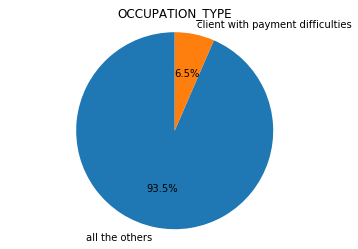

client with payment difficulties : 6278
all the others : 90113


In [51]:
# 職種ごとの集計、dfを作成し格納する

# 集計を格納するdf →.describe()の格納の仕方がわからなかったので、meanのみ
df_occu_type_mean = pd.DataFrame([])

labels = df[df.OCCUPATION_TYPE.notnull()]["OCCUPATION_TYPE"].unique() # OCCUPATION_TYPEの一覧を取得
for label in labels:
    print("OCCUPATION_TYPE : {}".format(label))
    # describe())
    display(df.query("OCCUPATION_TYPE =='" + label + "'").describe())
    df_occu_type_mean[label] = df.query("OCCUPATION_TYPE =='" + label + "'").describe().loc['mean']
    
    # plt.pie ("TAGEGET LABEL")
    df_occu_type_target = df.query("OCCUPATION_TYPE =='" + label + "'")
    plt.title("OCCUPATION_TYPE")
    plt.pie((df_occu_type_target["TARGET"].value_counts()), labels=["all the others", "client with payment difficulties"], startangle=90, autopct="%1.1f%%")
    plt.axis('equal')
    plt.show()
    print("client with payment difficulties :", df_occu_type_target["TARGET"].value_counts()[1])
    print("all the others :", df_occu_type_target["TARGET"].value_counts()[0])
    print("----------")

# about nan
print("OCCUPATION_TYPE : nan")
# describe())
display(df[df.OCCUPATION_TYPE.isnull()].describe())
df_occu_type_mean['nan'] = df[df.OCCUPATION_TYPE.isnull()].describe().loc['mean']

# plt.pie ("TAGEGET LABEL")
df_occu_type_target = df[df.OCCUPATION_TYPE.isnull()]
plt.title("OCCUPATION_TYPE")
plt.pie((df_occu_type_target["TARGET"].value_counts()), labels=["all the others", "client with payment difficulties"], startangle=90, autopct="%1.1f%%")
plt.axis('equal')
plt.show()
print("client with payment difficulties :", df_occu_type_target["TARGET"].value_counts()[1])
print("all the others :", df_occu_type_target["TARGET"].value_counts()[0])

# df_occu_type_mean.T
df_occu_type_mean = df_occu_type_mean.T

職種ごとに返済能力に差が出る。
返済能力の不足を比較すると、Accountantsは4.8%であり、Low-skill Laborersは17.2%に及ぶ。  
'OCCUPATION_TYPE'が欠損している場合の返済能力の不足は6.5%であり、全体平均の8.１%を下回っているため、'OCCUPATION_TYPE'が欠損しているから返済能力が低いとは言えない。

##### 職種ごとの中央値の比較

In [52]:
display(df_occu_type_mean)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
Laborers,277951.000979,0.105788,0.511742,166357.482525,570617.995597,26441.027001,507768.664136,0.020157,-14707.086453,-2424.143152,...,0.010419,0.000779,0.000598,0.000616,0.006161,0.007026,0.034073,0.276277,0.252648,1.910481
Core staff,277981.296264,0.063040,0.558070,172656.695254,625223.129380,27557.864032,565101.382805,0.020895,-14109.967247,-2797.755967,...,0.016104,0.000762,0.000653,0.000218,0.006518,0.007133,0.033370,0.286886,0.251507,1.682204
Accountants,277197.344645,0.048303,0.488536,194578.357842,709757.377255,30983.107216,648635.969547,0.022154,-14795.827779,-2394.102823,...,0.008968,0.001427,0.001630,0.000102,0.007187,0.006731,0.032512,0.336185,0.287588,1.710815
Managers,278557.399139,0.062140,0.509522,260336.681717,775091.194516,34861.673093,710024.672218,0.022397,-15375.125918,-2759.318937,...,0.009218,0.000936,0.000608,0.000234,0.007244,0.007348,0.033719,0.329425,0.250521,1.751251
Drivers,278369.686610,0.113261,0.511853,187011.606413,612333.969037,29071.181970,547811.301641,0.020876,-15103.108531,-1939.034618,...,0.008493,0.000699,0.000645,0.000591,0.006948,0.008138,0.030610,0.274429,0.259155,1.900720
Sales staff,279136.773908,0.096318,0.502181,152302.874710,563258.492088,26130.588533,504524.086218,0.019948,-14030.848203,-1703.789421,...,0.006292,0.000436,0.000623,0.000280,0.005798,0.006802,0.036759,0.239101,0.276937,1.955882
Cleaning staff,279890.247797,0.096067,0.363421,130790.895551,510960.949710,22901.733075,449499.580250,0.019903,-17277.854073,-2130.732431,...,0.005373,0.000215,0.000000,0.000000,0.006815,0.004291,0.031802,0.245331,0.275618,2.200404
Cooking staff,277249.663808,0.104440,0.483855,138396.508176,539174.315843,25082.813793,476501.780303,0.019635,-15145.885133,-2152.466868,...,0.007736,0.000505,0.000505,0.000168,0.005100,0.005492,0.031385,0.221656,0.253629,1.979600
Private service staff,277683.879336,0.065988,0.514329,182334.812783,630664.503394,29261.735294,566387.894637,0.022308,-14240.952112,-2238.281297,...,0.000754,0.001508,0.001508,0.000000,0.005835,0.008079,0.043986,0.309695,0.309695,1.926391
Medicine staff,276504.129085,0.067002,0.500996,149709.643434,607430.703057,25872.590265,540670.351724,0.019772,-15560.841513,-3750.265550,...,0.013354,0.000351,0.000234,0.000000,0.007263,0.007912,0.033593,0.263813,0.243580,1.814527


In [53]:
df_occu_type_mean.sort_values('TARGET', ascending=False)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
Low-skill Laborers,277323.944099,0.171524,0.460105,133228.001911,458464.781653,23235.564023,398566.645554,0.019270,-14217.544673,-1664.186813,...,0.003822,0.000000,0.000000,0.000478,0.004329,0.003092,0.026592,0.196660,0.276438,2.084725
Drivers,278369.686610,0.113261,0.511853,187011.606413,612333.969037,29071.181970,547811.301641,0.020876,-15103.108531,-1939.034618,...,0.008493,0.000699,0.000645,0.000591,0.006948,0.008138,0.030610,0.274429,0.259155,1.900720
Waiters/barmen staff,279728.885757,0.112760,0.452522,144272.583828,491451.966988,24256.729228,438908.255572,0.019831,-13054.165430,-1873.172849,...,0.007418,0.000742,0.000742,0.000000,0.004517,0.005420,0.040650,0.217706,0.275519,1.885276
Security staff,276908.539205,0.107424,0.376283,149662.695953,557080.293334,25065.525000,493276.323030,0.019620,-16532.951049,-1904.809106,...,0.006844,0.000744,0.000446,0.000595,0.005430,0.006131,0.037660,0.276406,0.265020,2.037835
Laborers,277951.000979,0.105788,0.511742,166357.482525,570617.995597,26441.027001,507768.664136,0.020157,-14707.086453,-2424.143152,...,0.010419,0.000779,0.000598,0.000616,0.006161,0.007026,0.034073,0.276277,0.252648,1.910481
Cooking staff,277249.663808,0.104440,0.483855,138396.508176,539174.315843,25082.813793,476501.780303,0.019635,-15145.885133,-2152.466868,...,0.007736,0.000505,0.000505,0.000168,0.005100,0.005492,0.031385,0.221656,0.253629,1.979600
Sales staff,279136.773908,0.096318,0.502181,152302.874710,563258.492088,26130.588533,504524.086218,0.019948,-14030.848203,-1703.789421,...,0.006292,0.000436,0.000623,0.000280,0.005798,0.006802,0.036759,0.239101,0.276937,1.955882
Cleaning staff,279890.247797,0.096067,0.363421,130790.895551,510960.949710,22901.733075,449499.580250,0.019903,-17277.854073,-2130.732431,...,0.005373,0.000215,0.000000,0.000000,0.006815,0.004291,0.031802,0.245331,0.275618,2.200404
Realty agents,281014.407457,0.078562,0.511318,195003.994674,655275.649134,30228.651132,587232.485353,0.021741,-13978.346205,-1785.003995,...,0.003995,0.000000,0.000000,0.000000,0.001587,0.001587,0.034921,0.230159,0.274603,2.036508
Secretaries,279208.548659,0.070498,0.519540,160541.662069,593520.413793,26853.325537,533820.465517,0.022413,-13994.684291,-2607.050575,...,0.016092,0.000766,0.000766,0.000000,0.009615,0.005245,0.030594,0.314685,0.271853,1.908217


<Figure size 1800x1500 with 0 Axes>

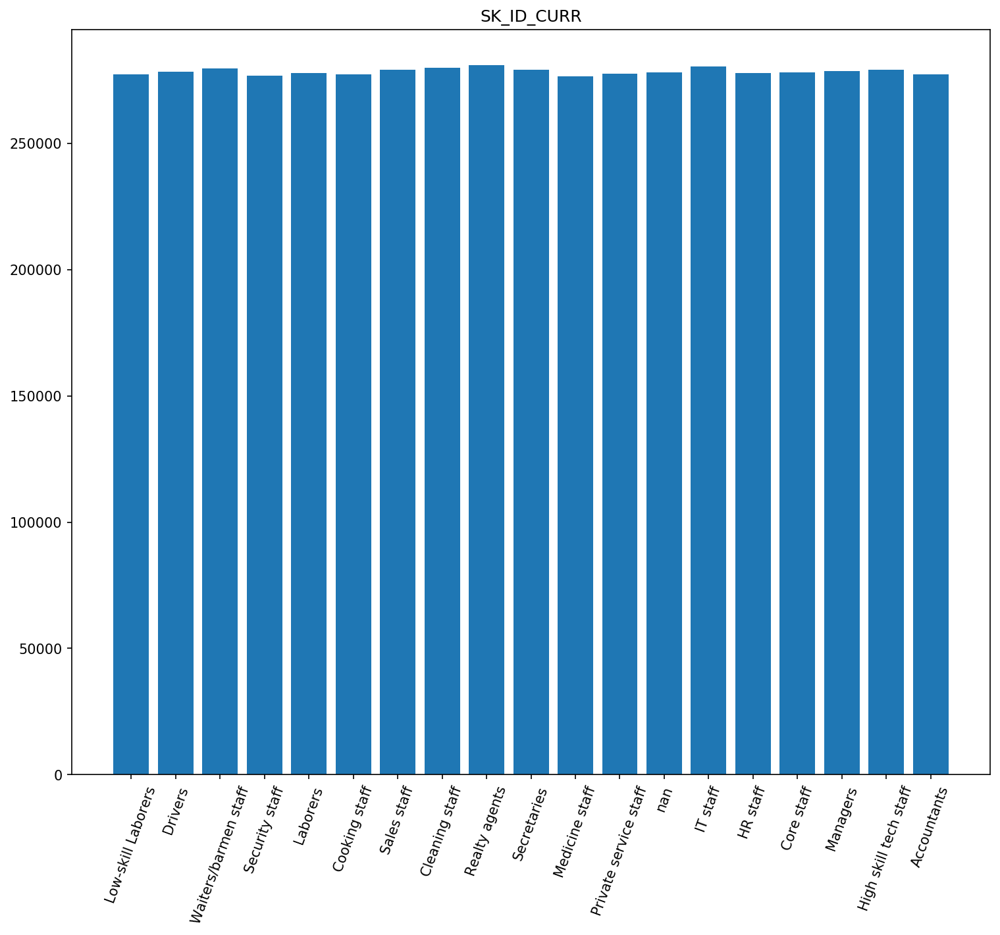

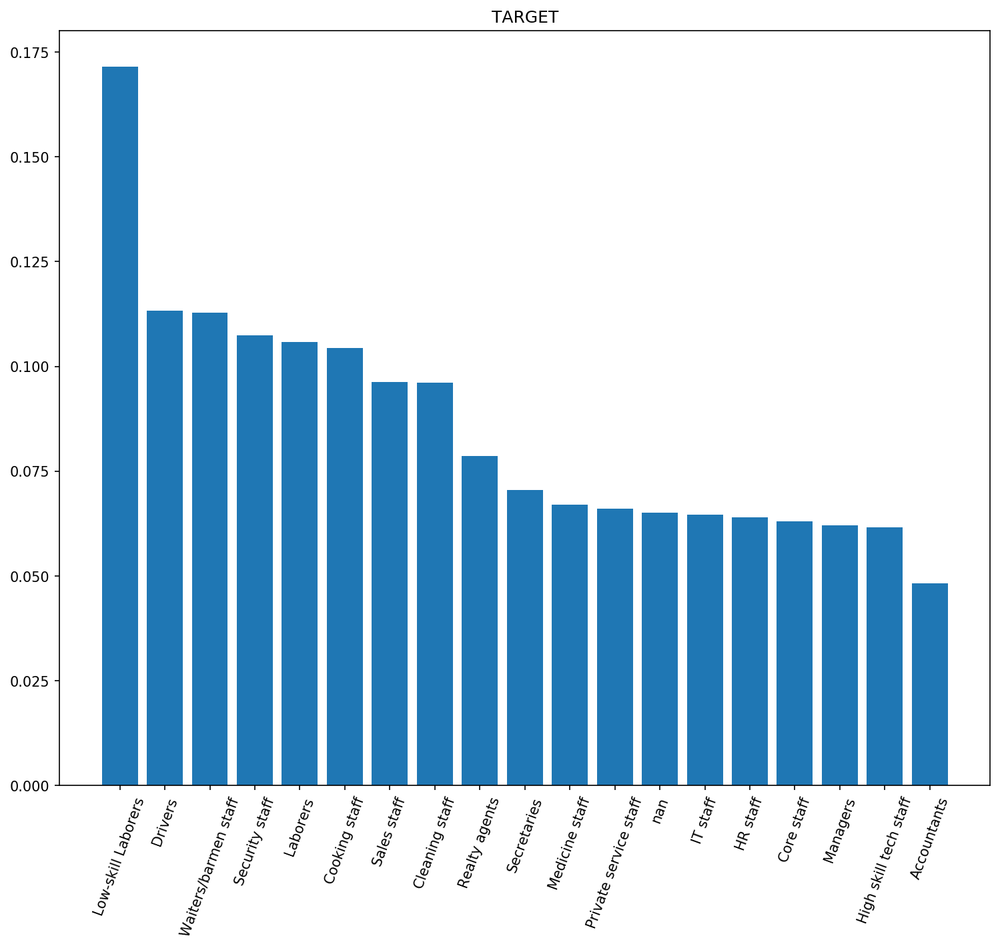

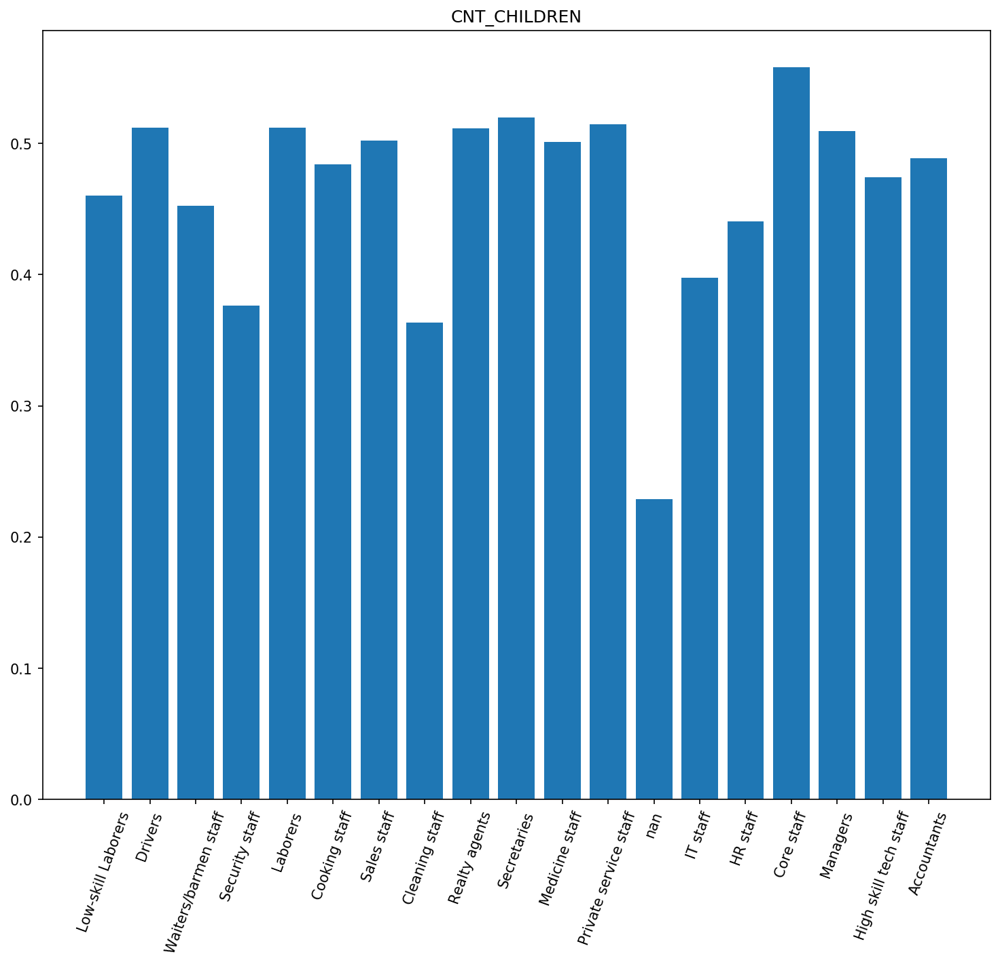

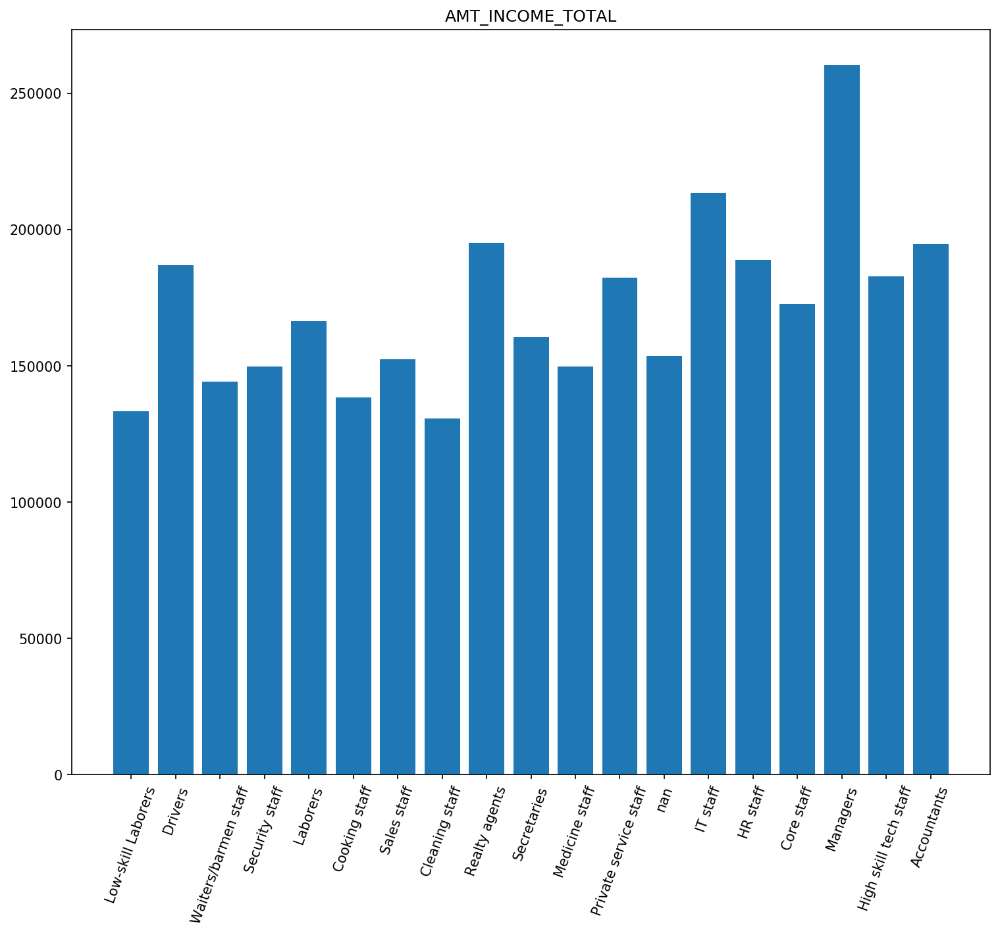

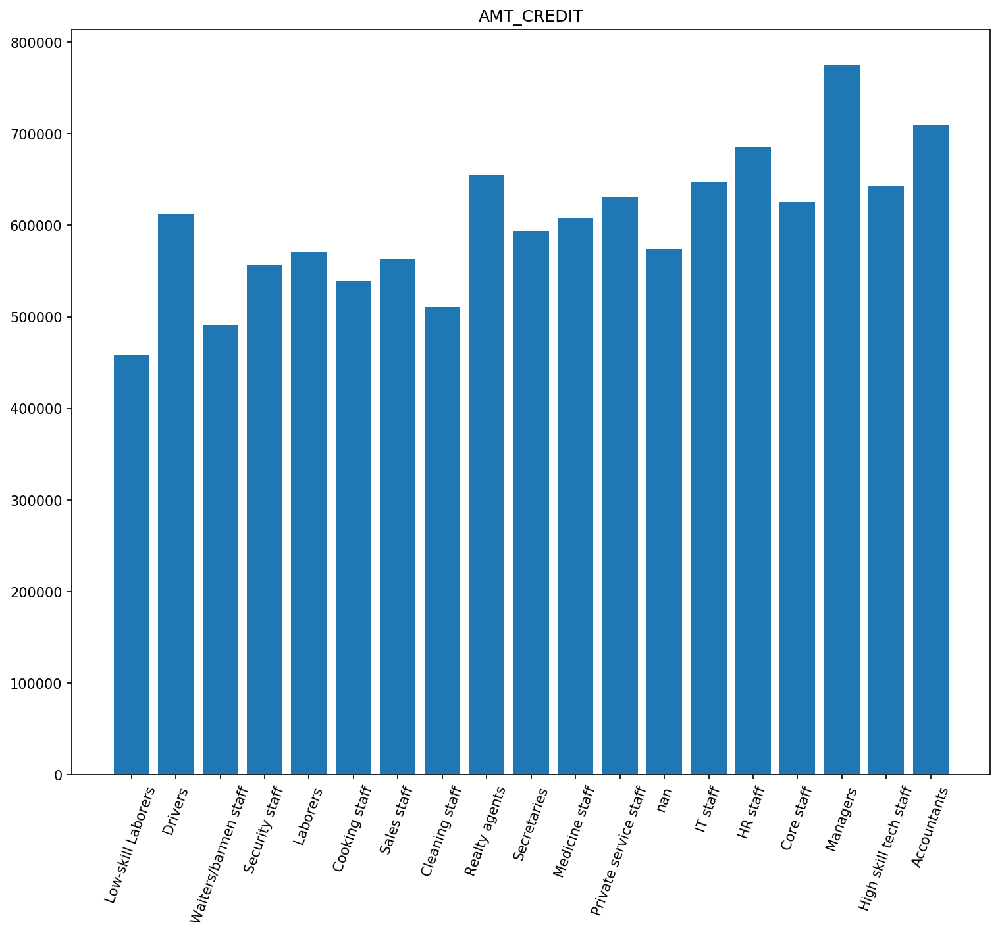

...

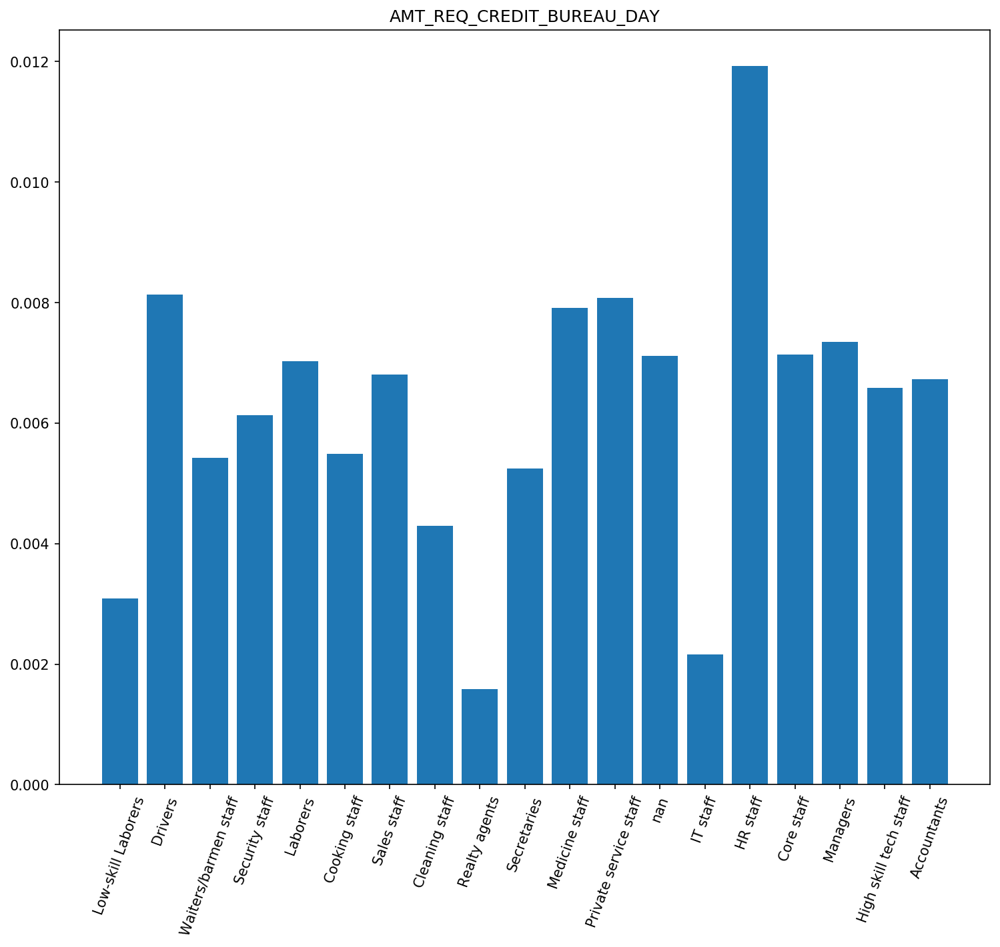

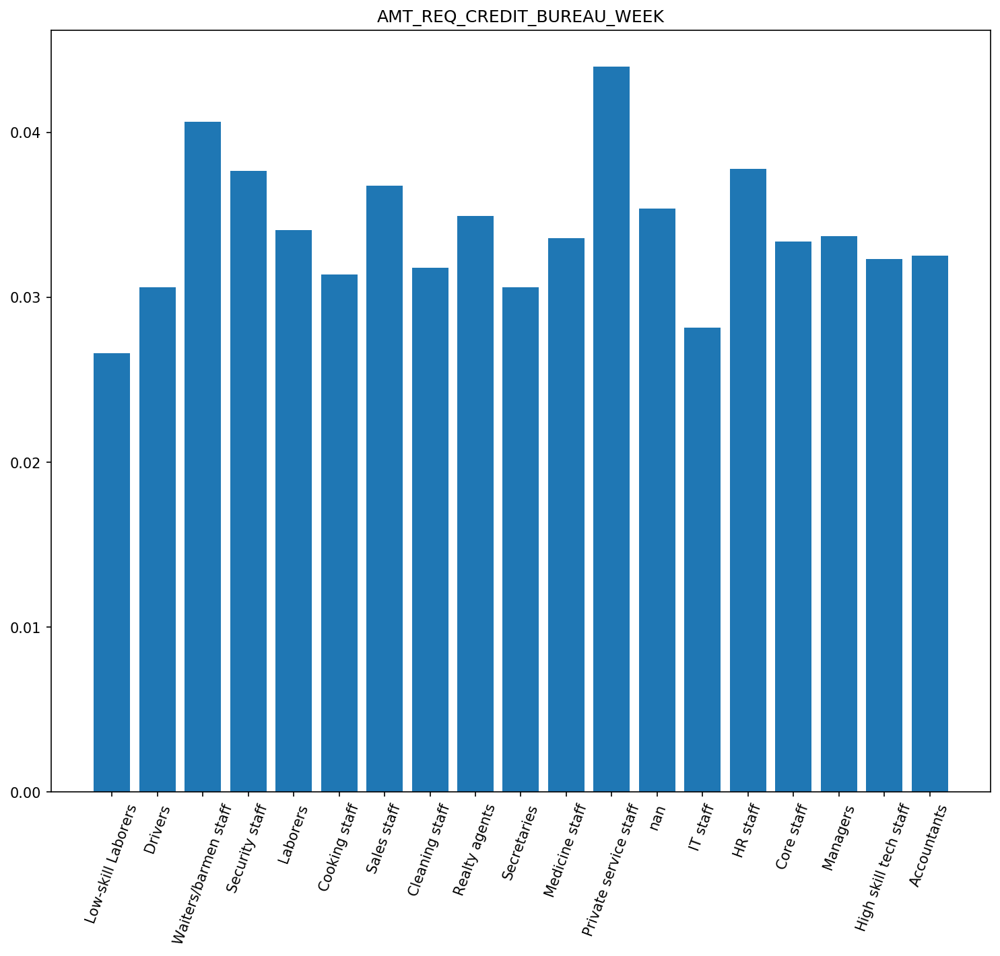

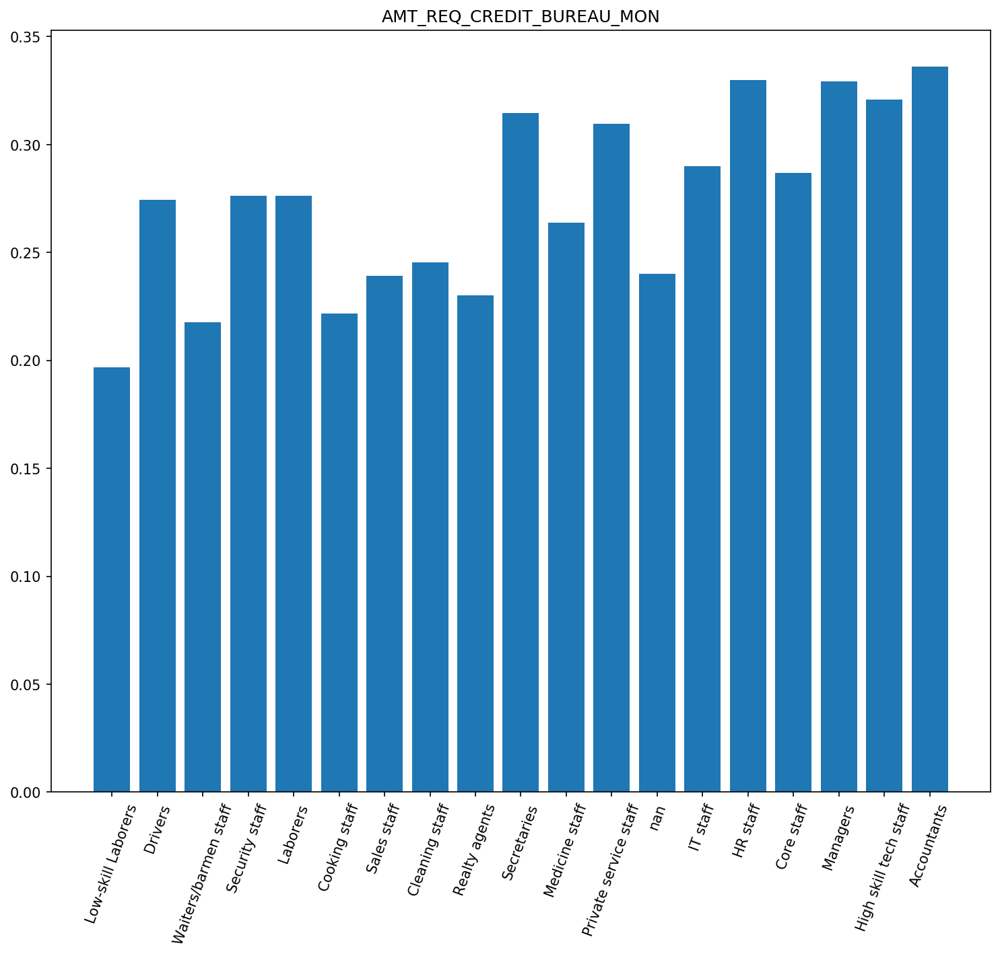

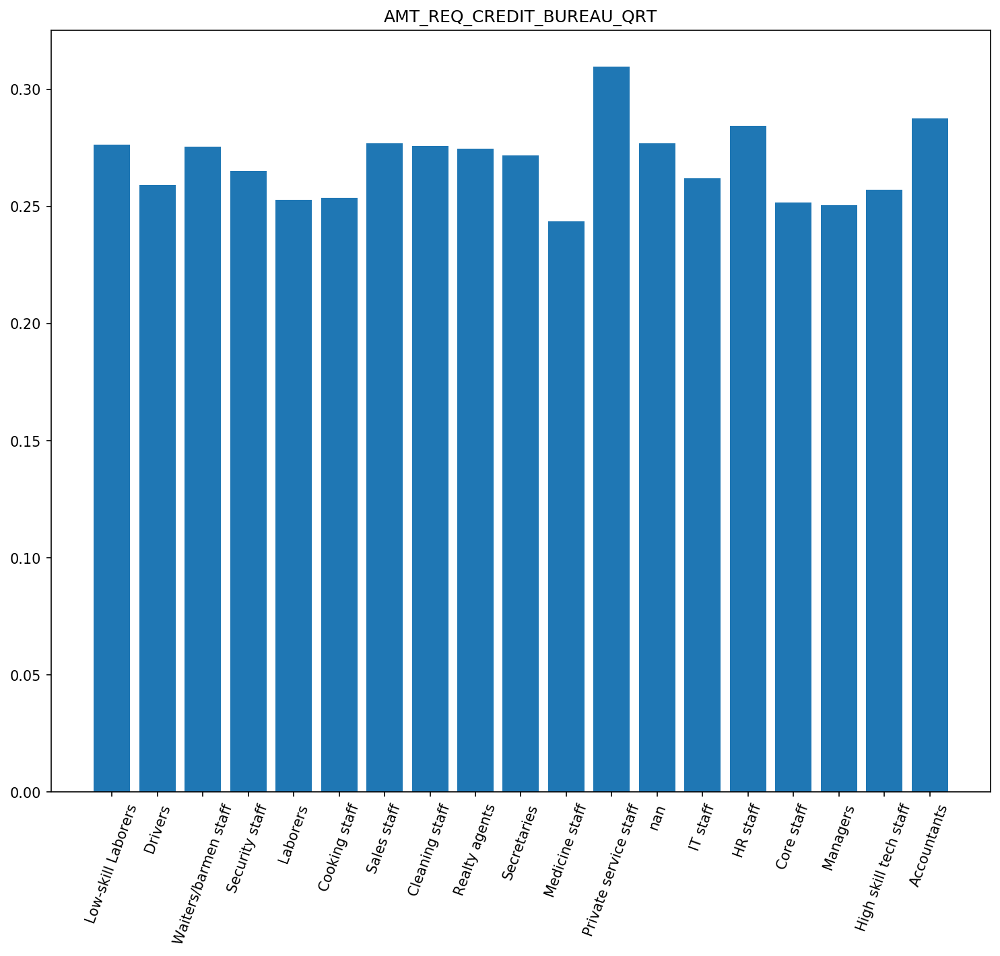

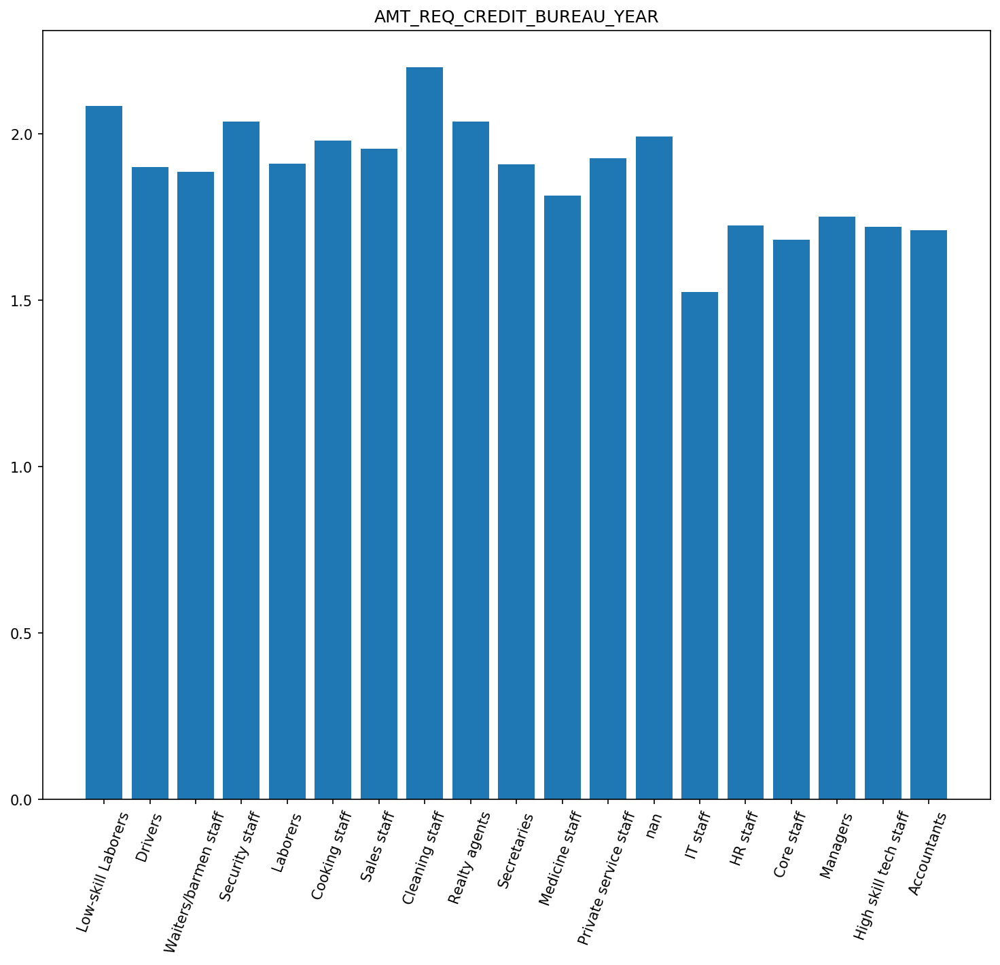

In [54]:
df_plot = df_occu_type_mean.sort_values('TARGET', ascending=False)
plt.figure(figsize=(12, 10), dpi=150)
for col in df_plot.columns:
    series_var = df_plot.loc[:, col]
    plt.figure(figsize=(12, 10), dpi=150)
    plt.title(col)
    plt.bar(series_var.index, series_var)
    plt.xticks(rotation=70)
    #plt.xticks(np.arange(0, 2, 1))
    plt.show()

TARGETが左肩上がりになるよう職種を並べ、特徴量の並び方を確認した。
OWN_CAR_AGEは左肩上がり、AMT_INCOME_TOTAL、AMT_CREDIT、AMT_ANNUITY、AMT_GOODS_PRICE、REGION＿POPULATION_RELATIVE、FLAG_PHONE、FLAG_EMAIL、EXT_SOURCE_1、EXT_SOURCE_2、AMT_REQ_CREDIT_BUREAU_MONは右肩上がりに職種が並んでいるようである。

#### 特徴量間の関係の確認

"AMT_INCOME_TOTAL"は、"AMT_CREDIT"、"AMT_ANNUNITY"、"AMT_GOODS_PRICE"は値が大きいので対数化する。

In [55]:
columns_log = ["AMT_INCOME_TOTAL"
                        ,"AMT_CREDIT"
                        ,"AMT_ANNUITY"
                        ,"AMT_GOODS_PRICE"]

df[columns_log] =  df[columns_log].apply(np.log)

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


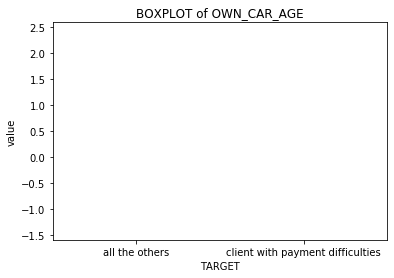

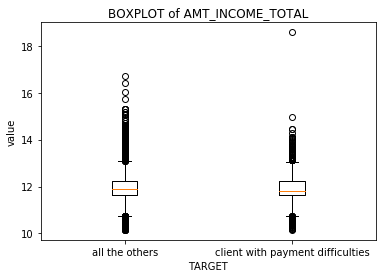

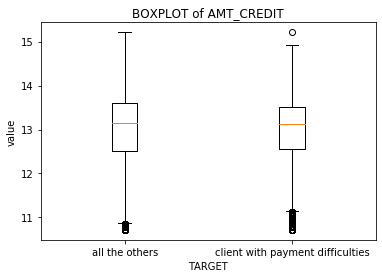

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


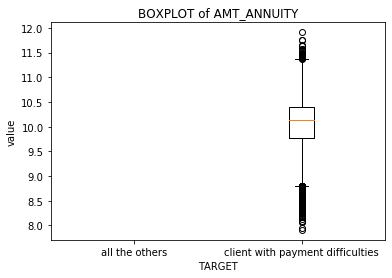

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


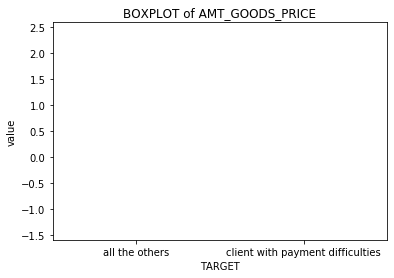

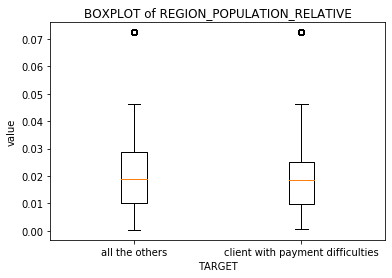

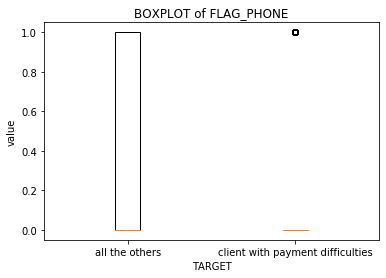

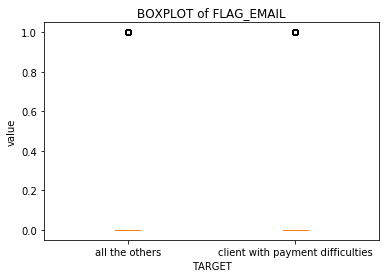

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


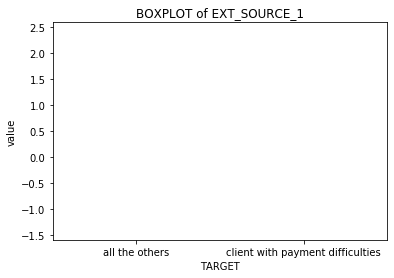

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


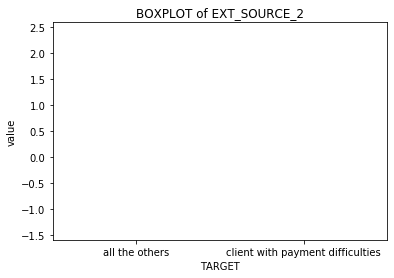

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


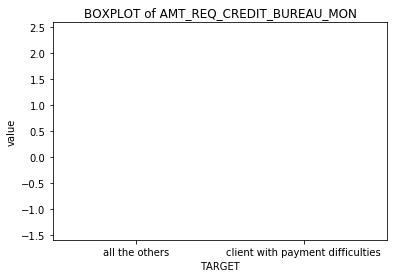

In [56]:
# 特徴量を一つずつ選び、箱ひげ図を使ってラベルごとのデータの分布を可視化する
features = ["OWN_CAR_AGE"
            ,"AMT_INCOME_TOTAL"
            ,"AMT_CREDIT"
            ,"AMT_ANNUITY"
            ,"AMT_GOODS_PRICE"
            ,"REGION_POPULATION_RELATIVE"
            ,"FLAG_PHONE"
            ,"FLAG_EMAIL"
            ,"EXT_SOURCE_1"
            ,"EXT_SOURCE_2"
            ,"AMT_REQ_CREDIT_BUREAU_MON"]

for feature in features:
    plt.boxplot([df[df["TARGET"]==0][feature], df[df["TARGET"]==1][feature]])
    plt.xticks([1, 2], ["all the others", "client with payment difficulties"])
    plt.title("BOXPLOT of {}".format(feature))
    plt.ylabel('value')
    plt.xlabel('TARGET')
    plt.show()

それぞれの特徴量に違いはあるようであるが、外れ値の影響が大きかったり、グラフが表示されなかったりする。

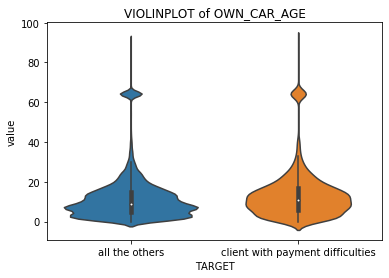

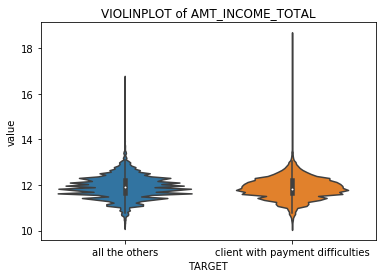

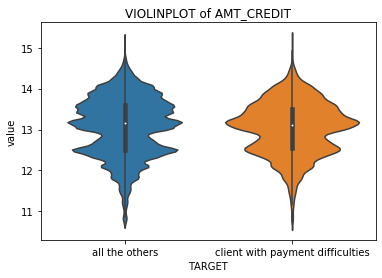

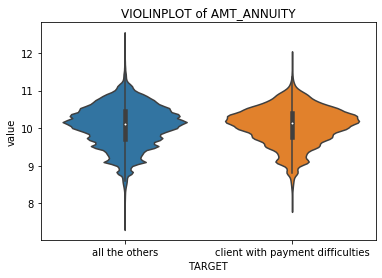

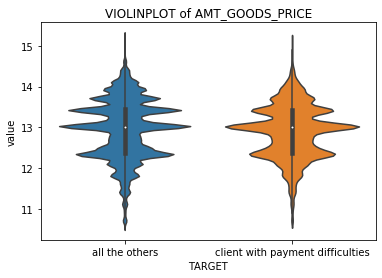

...

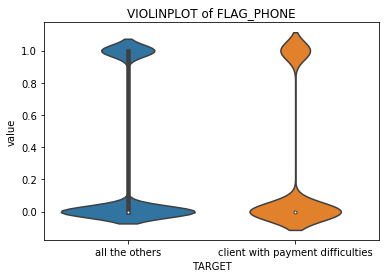

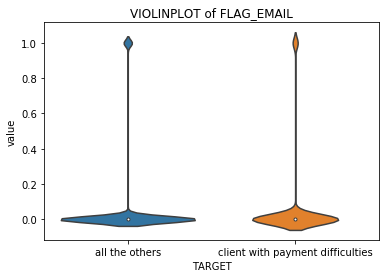

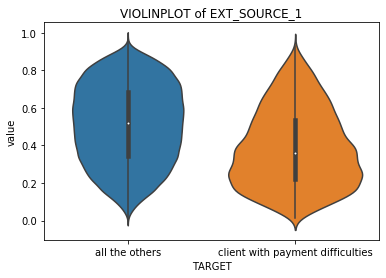

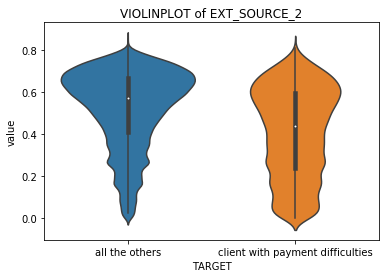

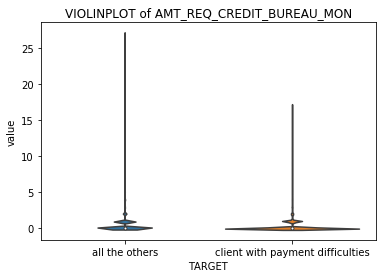

In [57]:
# 特徴量を一つずつ選び、バイオリン図を使ってラベルごとのデータの分布を可視化する

features = ["OWN_CAR_AGE"
            ,"AMT_INCOME_TOTAL"
            ,"AMT_CREDIT"
            ,"AMT_ANNUITY"
            ,"AMT_GOODS_PRICE"
            ,"REGION_POPULATION_RELATIVE"
            ,"FLAG_PHONE"
            ,"FLAG_EMAIL"
            ,"EXT_SOURCE_1"
            ,"EXT_SOURCE_2"
            ,"AMT_REQ_CREDIT_BUREAU_MON"]

for feature in features:
    #plt.violinplot([df[df["TARGET"]==0][feature], df[df["TARGET"]==1][feature]])
    ax = sns.violinplot("TARGET", feature, data=df)
    plt.xticks([0, 1], ["all the others", "client with payment difficulties"])
    plt.title("VIOLINPLOT of {}".format(feature))
    plt.ylabel('value')
    plt.xlabel('TARGET')
    plt.show()

返済能力がない集団の方が、各特徴量で分布のピークの数が少ないようである。満遍なく分布している傾向があるようである。  
FLAG_PHONE、FLAG_EMAIL、EXT_SOURCE_1、EXT_SOURCE_2、AMT_REQ_CREDIT_BUREAU_MONに違いあるように見える。  

/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/Users/ryuji_sato/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


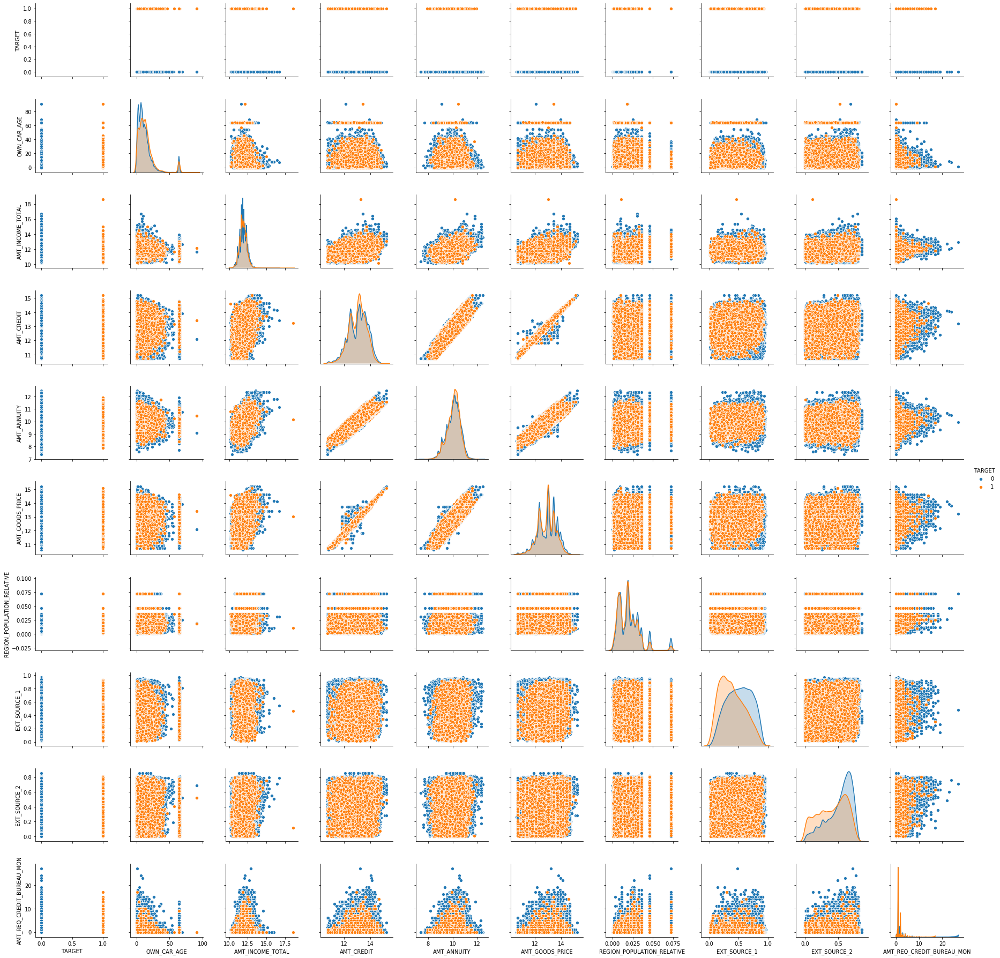

In [58]:
# 全ての組み合わせの散布図を一度に表示させる、散布図行列を作る
# ２値の特徴量は表示しない

features = ["TARGET"
            ,"OWN_CAR_AGE"
            ,"AMT_INCOME_TOTAL"
            ,"AMT_CREDIT"
            ,"AMT_ANNUITY"
            ,"AMT_GOODS_PRICE"
            ,"REGION_POPULATION_RELATIVE"
            ,"EXT_SOURCE_1"
            ,"EXT_SOURCE_2"
            ,"AMT_REQ_CREDIT_BUREAU_MON"]

sns.pairplot(df[features], hue="TARGET")
plt.show()

返済能力によって、EXT_SOURCE_1、EXT_SOURCE_2は分布に違いがあるようである。  
他の特徴量は分布が重なっているようてである。  

In [59]:
# 特徴量に関する相関係数行列を作る
features = ["TARGET"
            ,"OWN_CAR_AGE"
            ,"AMT_INCOME_TOTAL"
            ,"AMT_CREDIT"
            ,"AMT_ANNUITY"
            ,"AMT_GOODS_PRICE"
            ,"REGION_POPULATION_RELATIVE"
            ,"FLAG_PHONE"
            ,"FLAG_EMAIL"
            ,"EXT_SOURCE_1"
            ,"EXT_SOURCE_2"
            ,"AMT_REQ_CREDIT_BUREAU_MON"]

df[features].corr()

,TARGET,OWN_CAR_AGE,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,FLAG_PHONE,FLAG_EMAIL,EXT_SOURCE_1,EXT_SOURCE_2,AMT_REQ_CREDIT_BUREAU_MON
TARGET,1.000000,0.037612,-0.018482,-0.012181,0.000779,-0.022424,-0.037227,-0.023806,-0.001758,-0.155317,-0.160472,-0.012462
OWN_CAR_AGE,0.037612,1.000000,-0.158919,-0.089977,-0.093611,-0.099605,-0.081429,-0.063184,-0.018510,-0.083411,-0.080753,-0.021867
AMT_INCOME_TOTAL,-0.018482,-0.158919,1.000000,0.420705,0.481210,0.426493,0.174541,-0.010211,0.099663,0.077078,0.171316,0.072529
AMT_CREDIT,-0.012181,-0.089977,0.420705,1.000000,0.844716,0.988903,0.087443,0.012764,0.015859,0.156984,0.120467,0.051506
AMT_ANNUITY,0.000779,-0.093611,0.481210,0.844716,1.000000,0.843657,0.101107,0.003803,0.062699,0.111748,0.117890,0.041054
AMT_GOODS_PRICE,-0.022424,-0.099605,0.426493,0.988903,0.843657,1.000000,0.093964,0.029108,0.015093,0.164653,0.130055,0.053256
REGION_POPULATION_RELATIVE,-0.037227,-0.081429,0.174541,0.087443,0.101107,0.093964,1.000000,0.090939,0.040012,0.099997,0.198924,0.078607
FLAG_PHONE,-0.023806,-0.063184,-0.010211,0.012764,0.003803,0.029108,0.090939,1.000000,0.014657,0.081241,0.061178,0.031992
FLAG_EMAIL,-0.001758,-0.018510,0.099663,0.015859,0.062699,0.015093,0.040012,0.014657,1.000000,0.015678,0.023743,0.025669
EXT_SOURCE_1,-0.155317,-0.083411,0.077078,0.156984,0.111748,0.164653,0.099997,0.081241,0.015678,1.000000,0.213982,0.030820


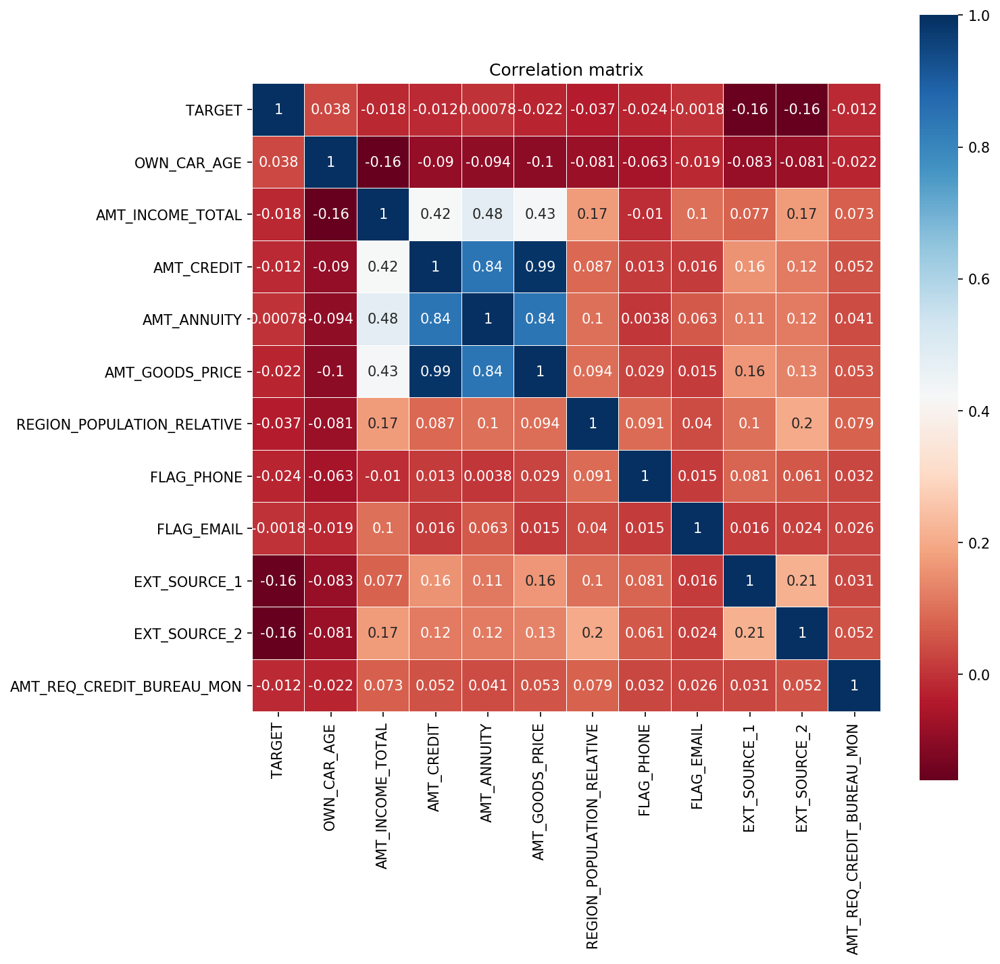

In [60]:
# 相関係数行列のヒートマップを作る
df_heatmap = df[features].corr()
colormap = plt.cm.RdBu
plt.figure(figsize=(10, 10), dpi=150)
plt.title('Correlation matrix')
sns.heatmap(df_heatmap, linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)
plt.show()

"AMT_CREDIT"、"AMT_ANNUITY"、"AMT_GOODS_PRICE"は強い正の相関である。散布も重なっている。  
特に"AMT_CREDIT"、"AMT_GOODS_PRICE"の相関係数は0.９９であるため、近似しているようである。
"TARGET"ととの相関については、強いてあげると"EXT_SOURCE_1" 、"EXT_SOURCE_2"が負の相関があるようである。  

### 設定課題の結果
>課題1:  
'OCCUPATION_TYPE'が欠損しているからといって、返済能力がないわけではないことの検証をする。  
  
'OCCUPATION_TYPE'が欠損している場合の返済能力の不足は6.5%であり、全体平均の8.１%を下回っているため、'OCCUPATION_TYPE'が欠損しているから返済能力が低いとは言えない。

>課題2:  
返済能力のない人の特徴を検証する。
  
"TARGET"ととの相関については、強いてあげると"EXT_SOURCE_1"、"EXT_SOURCE_2"が負の相関があるようである。 
"EXT_SOURCE_1"、"EXT_SOURCE_2"の値が低いほど、返済能力が低い傾向があるようである。

>課題3:  
職業ごとに返済能力に差があるか検証する。  
  
職種ごとに返済能力に差が出る。
返済能力の不足を比較すると、Accountantsは4.8%であり、Low-skill Laborersは17.2%に及ぶ。  

## 【問題5】（アドバンス課題）カーネルへの投稿